In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
import tensorflow as tf

from skimage.feature import local_binary_pattern
from skimage import io
from collections import defaultdict
from glob import glob
from PIL import Image

# Step 1: Conduct Explorator Data Analysis (EDA)

By performing EDA, you can have a better understanding about the data, which helps you decide whether to perform pre-processing (such as image filtering or feature engineering) 
and which methods to perform in order to improve the data quality. Check they're all the right size. Have training data for the model, this training data is .jpg images of 
cherry, strawberry, and tomato in their respective directories in train_data.

This is what I have done for my EDA:
- Image Property Extraction: Extracting image properties like size, aspect ratio, and resolution.
- Distribution Analysis: Plotting the distribution of image sizes and aspect ratios for the dataset.
- Image Transformations: Applying various image processing techniques such as sharpening, blurring, contrast adjustment, greyscale conversion, edge detection (Sobel and Canny), and thresholding.
- Color Channel Analysis: Displaying the RGB color channels separately for each image.
- Object and Background Analysis: Extracting and comparing object and background pixel values for each fruit category, with RGB channel histograms and statistics.

## Loading Paths and Image Dataset

- Created list for categories and path for the train file.
- Using glob to obtain all images in their respective directory.

In [2]:
train_data_path = '../train_data'
categories = ['cherry', 'strawberry', 'tomato']

In [3]:
cherry_images = glob('../train_data/cherry/*.jpg')
strawberry_images = glob('../train_data/strawberry/*.jpg')
tomato_images = glob('../train_data/tomato/*.jpg')

## Image Property Extraction

Extract basic image properties:
- Image ID
- Width
- Height
- Size (in bytes)
- Aspect ratio (Width/Height)

In [4]:
def extract_image_properties(image_paths):
    image_prop = defaultdict(list)
    for img_path in image_paths:
        img = Image.open(img_path)
        image_prop['image_id'].append(img_path[-12:-4])
        image_prop['width'].append(img.width)
        image_prop['height'].append(img.height)
        image_prop['size'].append(round(os.path.getsize(img_path)))
        image_prop['path'].append(img_path)
    return pd.DataFrame(image_prop)

Check image properties for the cherry dataset

In [5]:
cherry_data = extract_image_properties(cherry_images)
cherry_data['img_aspect_ratio'] = cherry_data['width'] / cherry_data['height']
cherry_data.sort_values(by='image_id', inplace=True)
cherry_data.reset_index(inplace=True, drop=True)

cherry_data

,image_id,width,height,size,path,img_aspect_ratio
0,rry_0001,300,300,31917,../train_data/cherry/cherry_0001.jpg,1.0
1,rry_0003,300,300,8586,../train_data/cherry/cherry_0003.jpg,1.0
2,rry_0004,300,300,28824,../train_data/cherry/cherry_0004.jpg,1.0
3,rry_0005,300,300,27932,../train_data/cherry/cherry_0005.jpg,1.0
4,rry_0006,300,300,21982,../train_data/cherry/cherry_0006.jpg,1.0
...,...,...,...,...,...,...
1490,rry_2348,300,300,14507,../train_data/cherry/cherry_2348.jpg,1.0
1491,rry_2350,300,300,20871,../train_data/cherry/cherry_2350.jpg,1.0
1492,rry_2353,300,300,20974,../train_data/cherry/cherry_2353.jpg,1.0
1493,rry_2354,300,300,5938,../train_data/cherry/cherry_2354.jpg,1.0


Check image properties for the strawberry dataset

In [6]:
strawberry_data = extract_image_properties(strawberry_images)
strawberry_data['img_aspect_ratio'] = strawberry_data['width'] / strawberry_data['height']
strawberry_data.sort_values(by='image_id', inplace=True)
strawberry_data.reset_index(inplace=True, drop=True)

strawberry_data

,image_id,width,height,size,path,img_aspect_ratio
0,rry_0003,300,300,16027,../train_data/strawberry/strawberry_0003.jpg,1.0
1,rry_0004,300,300,15680,../train_data/strawberry/strawberry_0004.jpg,1.0
2,rry_0005,300,300,22147,../train_data/strawberry/strawberry_0005.jpg,1.0
3,rry_0008,300,300,13647,../train_data/strawberry/strawberry_0008.jpg,1.0
4,rry_0013,300,300,18829,../train_data/strawberry/strawberry_0013.jpg,1.0
...,...,...,...,...,...,...
1490,rry_2149,300,300,15795,../train_data/strawberry/strawberry_2149.jpg,1.0
1491,rry_2150,300,300,21413,../train_data/strawberry/strawberry_2150.jpg,1.0
1492,rry_2152,300,300,14473,../train_data/strawberry/strawberry_2152.jpg,1.0
1493,rry_2153,300,300,20100,../train_data/strawberry/strawberry_2153.jpg,1.0


Check image properties for the tomato dataset

In [7]:
tomato_data = extract_image_properties(tomato_images)
tomato_data['img_aspect_ratio'] = tomato_data['width'] / tomato_data['height']
tomato_data.sort_values(by='image_id', inplace=True)
tomato_data.reset_index(inplace=True, drop=True)

tomato_data

,image_id,width,height,size,path,img_aspect_ratio
0,ato_0003,300,300,11851,../train_data/tomato/tomato_0003.jpg,1.0
1,ato_0004,300,300,11434,../train_data/tomato/tomato_0004.jpg,1.0
2,ato_0005,300,300,9612,../train_data/tomato/tomato_0005.jpg,1.0
3,ato_0006,300,300,20684,../train_data/tomato/tomato_0006.jpg,1.0
4,ato_0009,300,300,21672,../train_data/tomato/tomato_0009.jpg,1.0
...,...,...,...,...,...,...
1490,ato_2004,300,300,8837,../train_data/tomato/tomato_2004.jpg,1.0
1491,ato_2005,300,300,27279,../train_data/tomato/tomato_2005.jpg,1.0
1492,ato_2007,300,300,12191,../train_data/tomato/tomato_2007.jpg,1.0
1493,ato_2008,300,300,7723,../train_data/tomato/tomato_2008.jpg,1.0


Check if there are images with a width or height less than 300 pixels in each dataset

Can see in the cherry dataset there is a total 20 .jpgs less than 300 in size

In [8]:
print("Cherry images with width or height less than 300")
print(cherry_data[(cherry_data['width'] < 300) | (cherry_data['height'] < 300)])
print("Count: ", len(cherry_data[(cherry_data['width'] < 300) | (cherry_data['height'] < 300)]))

Cherry images with width or height less than 300
      image_id  width  height   size                                  path  \
73    rry_0113    219     230   5061  ../train_data/cherry/cherry_0113.jpg   
145   rry_0226    299     169   8649  ../train_data/cherry/cherry_0226.jpg   
158   rry_0257    220     229  11193  ../train_data/cherry/cherry_0257.jpg   
222   rry_0366    261     193  11361  ../train_data/cherry/cherry_0366.jpg   
520   rry_0843    225     225   3728  ../train_data/cherry/cherry_0843.jpg   
542   rry_0873    225     225   7499  ../train_data/cherry/cherry_0873.jpg   
621   rry_1005    225     225   6059  ../train_data/cherry/cherry_1005.jpg   
632   rry_1017    225     225   8770  ../train_data/cherry/cherry_1017.jpg   
633   rry_1019    275     183  11082  ../train_data/cherry/cherry_1019.jpg   
634   rry_1020    225     225   6212  ../train_data/cherry/cherry_1020.jpg   
666   rry_1066    181     278  16095  ../train_data/cherry/cherry_1066.jpg   
726   rry_1154 

Can see in the strawberry dataset there is a total 20 .jpgs less than 300 in size

In [9]:
print("Strawberry images with width or height less than 300")
print(strawberry_data[(strawberry_data['width'] < 300) | (strawberry_data['height'] < 300)])
print("Count: ", len(strawberry_data[(strawberry_data['width'] < 300) | (strawberry_data['height'] < 300)]))

Strawberry images with width or height less than 300
      image_id  width  height   size  \
43    rry_0082    181     279  12693   
44    rry_0083    225     225   3484   
45    rry_0084    300     168   7727   
245   rry_0388    221     228   7474   
257   rry_0403    262     193  21866   
318   rry_0497    301     167   8951   
384   rry_0592    183     276   6104   
437   rry_0662    225     225   7113   
580   rry_0857    238     211  11249   
635   rry_0931    366     138  17727   
718   rry_1047    275     183  18339   
789   rry_1154    310     163   7419   
814   rry_1189    277     182   5681   
815   rry_1192    225     225   6675   
971   rry_1415    214     236  11044   
1067  rry_1558    225     225  10393   
1233  rry_1781    182     277  17158   
1419  rry_2038    225     225   8323   

                                              path  img_aspect_ratio  
43    ../train_data/strawberry/strawberry_0082.jpg          0.648746  
44    ../train_data/strawberry/strawberry_00

Can see in the tomato dataset there is a total 18 .jpgs less than 300 in size

In [10]:
print("Tomato images with width or height less than 300")
print(tomato_data[(tomato_data['width'] < 300) | (tomato_data['height'] < 300)])
print("Count: ", len(tomato_data[(tomato_data['width'] < 300) | (tomato_data['height'] < 300)]))

Tomato images with width or height less than 300
      image_id  width  height   size                                  path  \
66    ato_0091    253     199   6680  ../train_data/tomato/tomato_0091.jpg   
67    ato_0092    225     225   6394  ../train_data/tomato/tomato_0092.jpg   
108   ato_0154    225     225   3830  ../train_data/tomato/tomato_0154.jpg   
109   ato_0155    301     168   4237  ../train_data/tomato/tomato_0155.jpg   
110   ato_0156    225     225   6757  ../train_data/tomato/tomato_0156.jpg   
111   ato_0157    256     197   8070  ../train_data/tomato/tomato_0157.jpg   
159   ato_0228    259     194  17229  ../train_data/tomato/tomato_0228.jpg   
194   ato_0282    275     183   5303  ../train_data/tomato/tomato_0282.jpg   
306   ato_0433    254     199   8726  ../train_data/tomato/tomato_0433.jpg   
352   ato_0500    178     283   9936  ../train_data/tomato/tomato_0500.jpg   
365   ato_0516    225     225   6063  ../train_data/tomato/tomato_0516.jpg   
879   ato_1188 

## Plot Size and Aspect Ratio Distribution of Images

- Help assess overall dataset quality and how uniform dataset is

In [11]:
def plot_image_distribution(image_data, title):
    plt.style.use('Solarize_Light2')
    fig, ax = plt.subplots(1, 2, figsize=(16, 5))
    sns.histplot(x='size', data=image_data, bins=100, ax=ax[0])
    ax[0].set_title(f"{title} Size Distribution")
    ax[0].set_ylabel("Frequency")
    
    sns.histplot(x='img_aspect_ratio', data=image_data, bins=100, ax=ax[1])
    ax[1].set_title(f"{title} Aspect Ratio")
    ax[1].set_ylabel("Frequency")
    plt.show()

Histogram of size and aspect ratio distribution of cherry images in the dataset

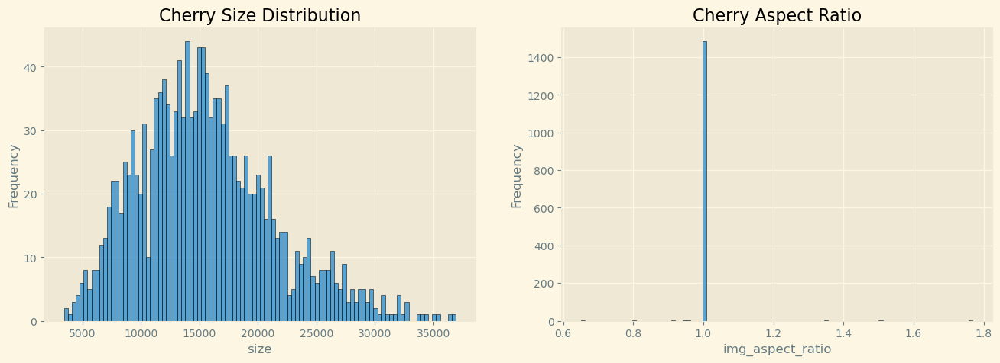

In [12]:
plot_image_distribution(cherry_data, "Cherry")

Histogram of size and aspect ratio distribution of strawberry images in the dataset

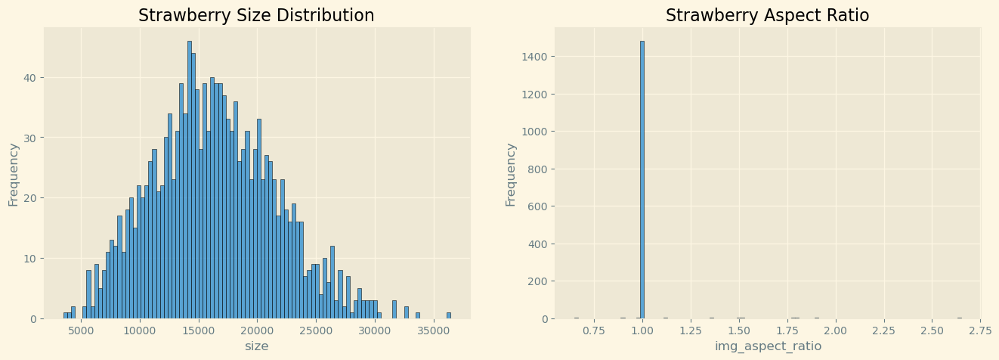

In [13]:
plot_image_distribution(strawberry_data, "Strawberry")

Histogram of size and aspect ratio distribution of tomato images in the dataset

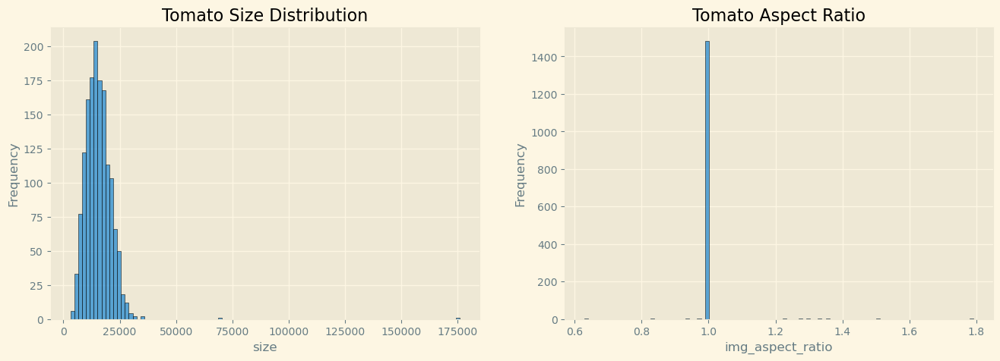

In [14]:
plot_image_distribution(tomato_data, "Tomato")

## Extracted Images that did not involve there respective feature

- Have manually removed images that did not relate or show the respective feature

In [15]:
cherry_extracted_images = glob('../sorted_train_data/cherry/*.jpg')
strawberry_extracted_images = glob('../sorted_train_data/strawberry/*.jpg')
tomato_extracted_images = glob('../sorted_train_data/tomato/*.jpg')

In [16]:
# print the number of images in each category

print(f"Number of Cherry images: {len(cherry_images)}")
print(f"Number of Strawberry images: {len(strawberry_images)}")
print(f"Number of Tomato images: {len(tomato_images)}")

print(f"Number of Extracted Cherry images: {len(cherry_extracted_images)}")
print(f"Number of Extracted Strawberry images: {len(strawberry_extracted_images)}")
print(f"Number of Extracted Tomato images: {len(tomato_extracted_images)}")

Number of Cherry images: 1495
Number of Strawberry images: 1495
Number of Tomato images: 1495
Number of Extracted Cherry images: 1478
Number of Extracted Strawberry images: 1466
Number of Extracted Tomato images: 1475


## Image Analysis For Each Dataset

- Analyzed the datatype, shape and array of images within each dataset to get further understanding
- Plotted distribution of pixels in each image to get an understanding of how 'images' are constructed which can help
understand the pixel intensity variations in an image

Analyzed dtype, shape and array of cherry image

In [17]:
cherry_image_cv2 = cv2.imread(cherry_images[0])
print(type(cherry_image_cv2))
print(cherry_image_cv2.shape)
print(cherry_image_cv2)

<class 'numpy.ndarray'>
(300, 300, 3)
[[[ 86 108  83]
  [ 83 105  80]
  [ 80 102  77]
  ...
  [131 181 171]
  [129 182 172]
  [125 181 170]]

 [[ 85 107  82]
  [ 83 105  80]
  [ 79 101  76]
  ...
  [130 180 170]
  [128 181 171]
  [124 180 169]]

 [[ 84 106  81]
  [ 81 103  78]
  [ 78 100  75]
  ...
  [129 176 167]
  [129 180 172]
  [126 179 170]]

 ...

 [[ 53  72  53]
  [ 53  72  53]
  [ 53  72  53]
  ...
  [ 35  88  49]
  [ 34  87  48]
  [ 34  87  48]]

 [[ 53  72  53]
  [ 53  72  53]
  [ 53  72  53]
  ...
  [ 33  86  47]
  [ 32  84  47]
  [ 31  83  46]]

 [[ 54  73  54]
  [ 54  73  54]
  [ 54  73  54]
  ...
  [ 33  86  47]
  [ 32  84  47]
  [ 31  83  46]]]


Plotted distribution of pixel values of that flattened cherry image

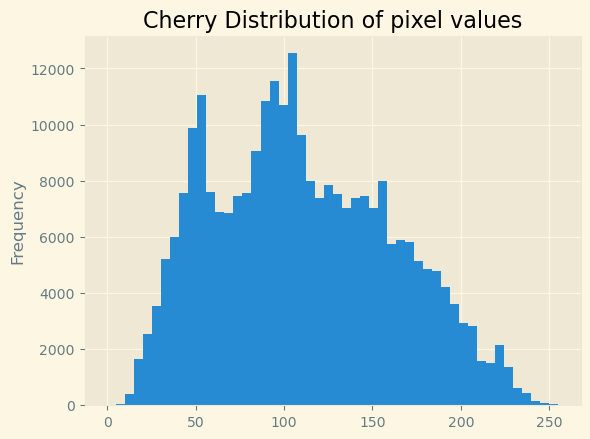

In [18]:
pd.Series(cherry_image_cv2.flatten()).plot(kind='hist', bins=50, title='Cherry Distribution of pixel values')
plt.show()

Analyzed dtype, shape, and array of strawberry image

In [19]:
strawberry_image_cv2 = cv2.imread(strawberry_images[0])
print(type(strawberry_image_cv2))
print(strawberry_image_cv2.shape)
print(strawberry_image_cv2)

<class 'numpy.ndarray'>
(300, 300, 3)
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


Plotted distribution of pixel values of that flattened strawberry image

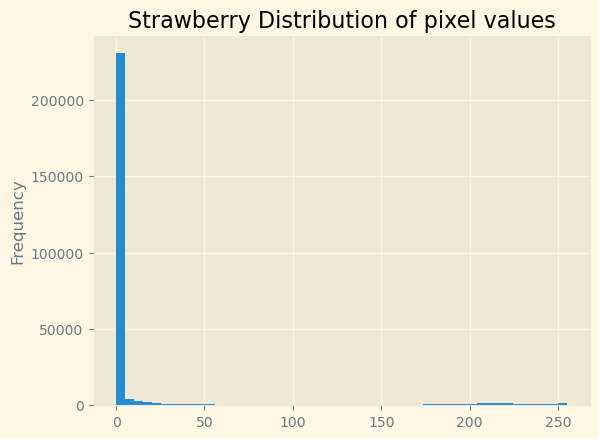

In [20]:
pd.Series(strawberry_image_cv2.flatten()).plot(kind='hist', bins=50, title='Strawberry Distribution of pixel values')
plt.show()

Analyzed dtype, shape, and array of strawberry image

In [21]:
tomato_image_cv2 = cv2.imread(tomato_images[0])
print(type(tomato_image_cv2))
print(tomato_image_cv2.shape)
print(tomato_image_cv2)

<class 'numpy.ndarray'>
(300, 300, 3)
[[[223 229 236]
  [223 229 236]
  [223 229 236]
  ...
  [ 93 136 125]
  [ 93 134 127]
  [ 94 131 127]]

 [[210 216 223]
  [210 216 223]
  [209 215 222]
  ...
  [  3  46  35]
  [  3  44  37]
  [  4  41  37]]

 [[206 212 219]
  [206 212 219]
  [206 212 219]
  ...
  [  9  52  41]
  [  9  50  43]
  [  8  48  43]]

 ...

 [[207 205 204]
  [207 205 204]
  [206 204 203]
  ...
  [ 47  84 196]
  [ 42  76 189]
  [ 38  72 185]]

 [[206 204 203]
  [206 204 203]
  [205 203 202]
  ...
  [ 66 105 180]
  [ 64 100 178]
  [ 61  97 175]]

 [[251 249 248]
  [250 248 247]
  [250 248 247]
  ...
  [176 216 255]
  [176 213 255]
  [175 212 255]]]


Plotted distribution of pixel values of that flattened tomato image

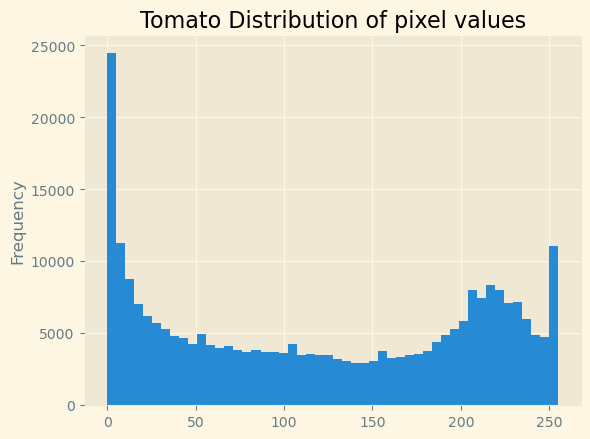

In [22]:
pd.Series(tomato_image_cv2.flatten()).plot(kind='hist', bins=50, title='Tomato Distribution of pixel values')
plt.show()

## Initial Image Transformations and Filters

Applying image transformation techniques to analyze image modification techniques that could be used for model:
- Sharpening (Kernel to enchance edges)
- Blurring (3x3 kernel for smoothing)
- Contrast Adjustment (increase contrast for better visibility of details)
- Grayscale (Transforming Image to Grayscale)
- Edge Detection (Sobel and Canny Edge Detection)
- Threshold

In [23]:
def display_original_image_transformations(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    img_resized = cv2.resize(img, (0, 0), fx=0.2, fy=0.2)
    kernel_sharpening = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    kernel_3x3 = np.ones((3, 3), np.float32) / 9
    sharpened_img = cv2.filter2D(img_resized, -1, kernel_sharpening)
    blurred = cv2.filter2D(img_resized, -1, kernel_3x3)
    contrast_img = cv2.addWeighted(img_resized, 2.5, np.zeros(img_resized.shape, img_resized.dtype), 0, 0)
    img_gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    sobel_x = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
    sobel_combined = cv2.magnitude(sobel_x, sobel_y)
    edge_img = cv2.Canny(img_resized, 10, 1000)
    threshold_img = cv2.threshold(img_gray, 0.5, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    fig, ax = plt.subplots(1, 7, figsize=(15, 20))
    ax[0].imshow(sharpened_img)
    ax[0].set_title('Kernel S')
    
    ax[1].imshow(blurred)
    ax[1].set_title('Kernel 3')
    
    ax[2].imshow(contrast_img)
    ax[2].set_title('Inc.Contrast')
    
    ax[3].imshow(img_gray, cmap='gray')
    ax[3].set_title('Gray')
    
    ax[4].imshow(sobel_combined)
    ax[4].set_title('Edges')
    
    ax[5].imshow(edge_img, cmap='gray')
    ax[5].set_title('Canny-Edge')
    
    ax[6].imshow(threshold_img[1], cmap='gray')
    ax[6].set_title('Threshold')
    
    plt.show()
    
    return img, img_resized, sharpened_img, blurred, contrast_img, img_gray, sobel_combined, edge_img

## Color Channel Analysis/Display

Displays RGB Channels in the image separately. Helps to better understand the different channels in the image
and how they contribute to form the image

In [24]:
def display_rgb_values(image, title):
    if len(image.shape) == 2: 
        image_rgb = np.stack((image,)*3, axis=-1)
    else:
        image_rgb = image

    fig, ax = plt.subplots(1, 4, figsize=(15, 5))
    ax[0].imshow(image_rgb)
    ax[0].set_title(f'{title}')
    
    ax[1].imshow(image_rgb[:, :, 0], cmap='Reds')
    ax[1].set_title(f'{title} - R')
    
    ax[2].imshow(image_rgb[:, :, 1], cmap='Greens')
    ax[2].set_title(f'{title} - G')
    
    ax[3].imshow(image_rgb[:, :, 2], cmap='Blues')
    ax[3].set_title(f'{title} - B')
    
    plt.show()

Argument is a image path, which it then reads, converts to RGB form and displays the RGB values of that image

In [25]:
def display_color_channels(image_path):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    fig, axs = plt.subplots(1, 4, figsize=(15, 5))
    axs[0].imshow(img_rgb)
    axs[1].imshow(img_rgb[:, :, 0], cmap='Reds')
    axs[2].imshow(img_rgb[:, :, 1], cmap='Greens')
    axs[3].imshow(img_rgb[:, :, 2], cmap='Blues')
    plt.show()

Shows image transformation techniques on a cherry image. Obtain transformed cherry images.

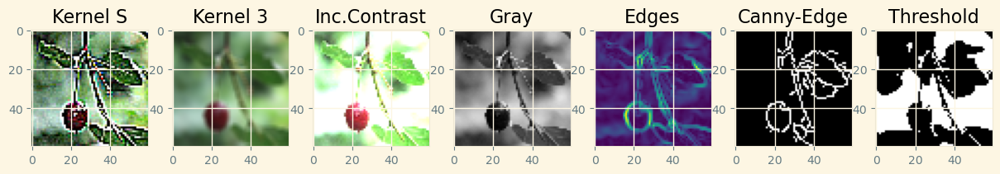

In [26]:
ch_img, cherry_img_resized, cherry_sharpened_img, cherry_blurred, cherry_contrast_img, cherry_img_gray, cherry_sobel, cherry_edge_img = display_original_image_transformations(cherry_images[0])

Display the transformed cherry image's rgb values 

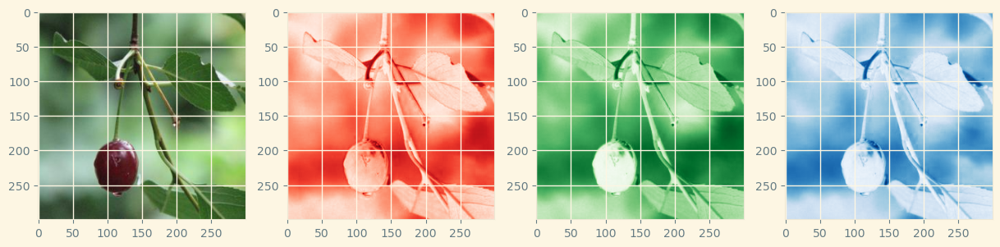

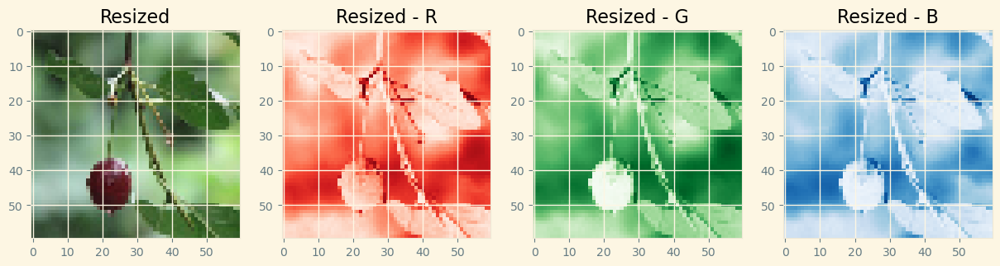

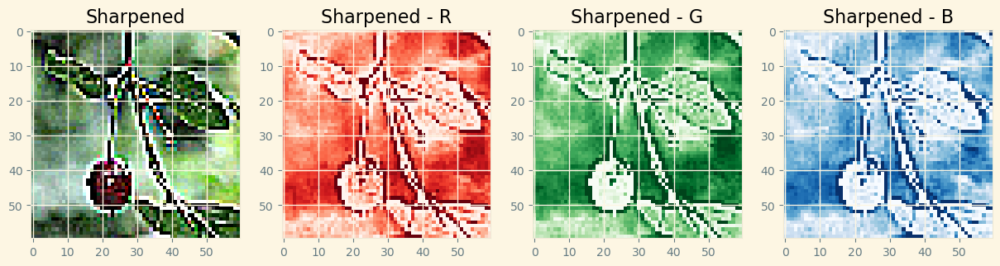

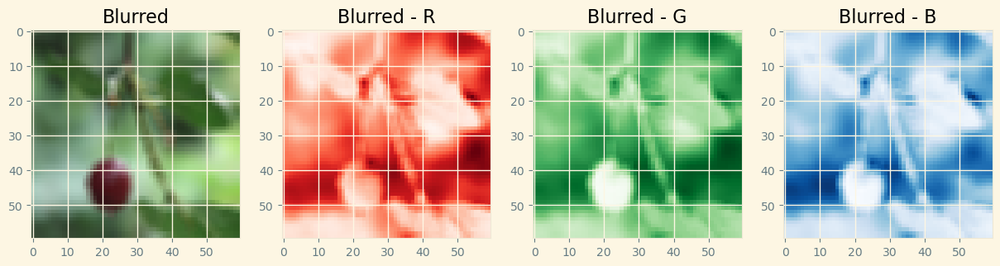

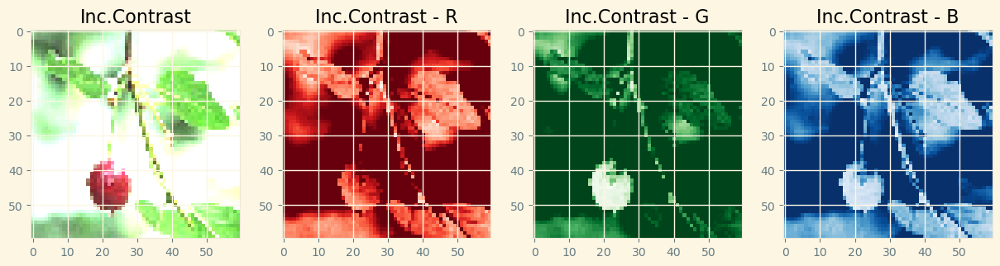

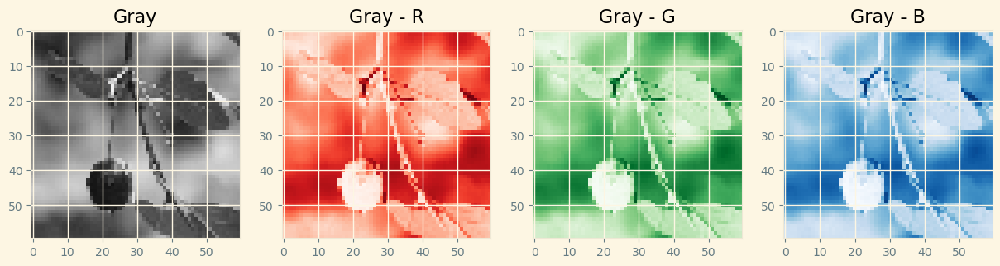

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..765.5181251936494].


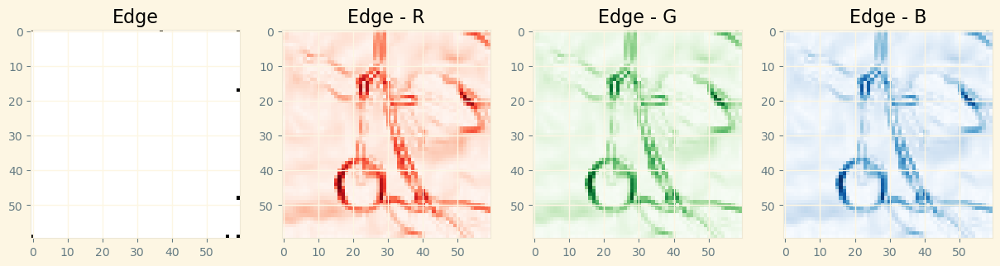

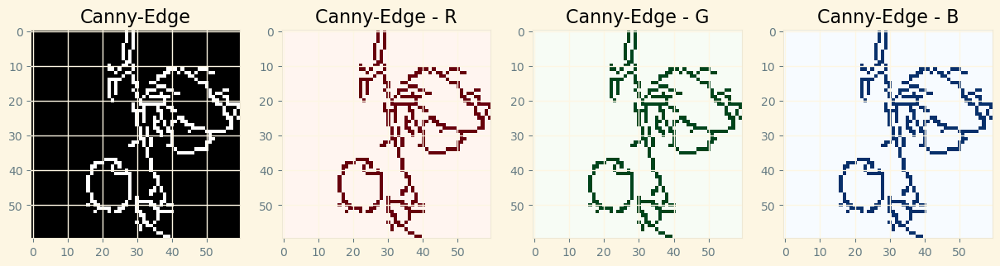

In [27]:
display_color_channels(cherry_images[0])
display_rgb_values(cherry_img_resized, "Resized")
display_rgb_values(cherry_sharpened_img, "Sharpened")
display_rgb_values(cherry_blurred, "Blurred")
display_rgb_values(cherry_contrast_img, "Inc.Contrast")
display_rgb_values(cherry_img_gray, "Gray")
display_rgb_values(cherry_sobel, "Edge")
display_rgb_values(cherry_edge_img, "Canny-Edge")

Shows image transformation techniques on a strawberry image. Obtain transformation strawberry images.

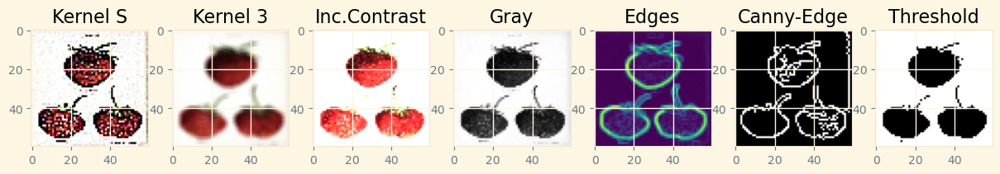

In [28]:
st_img, strawberry_img_resized, strawberry_sharpened_img, strawberry_blurred, strawberry_contrast_img, strawberry_img_gray, strawberry_sobel, strawberry_edge_img = display_original_image_transformations(strawberry_images[2])

Display the transformed strawberry image's rgb values

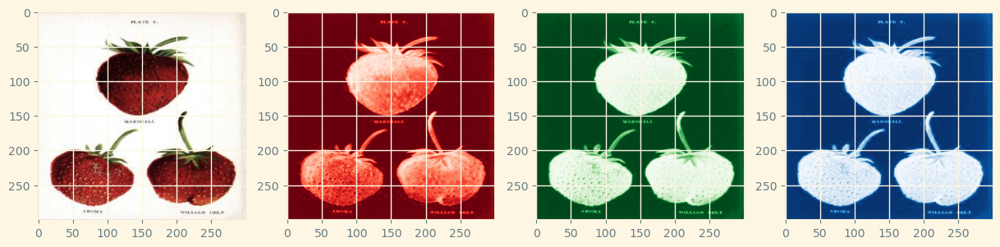

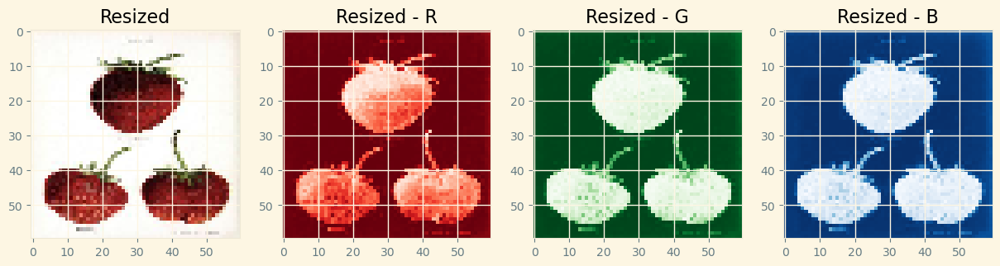

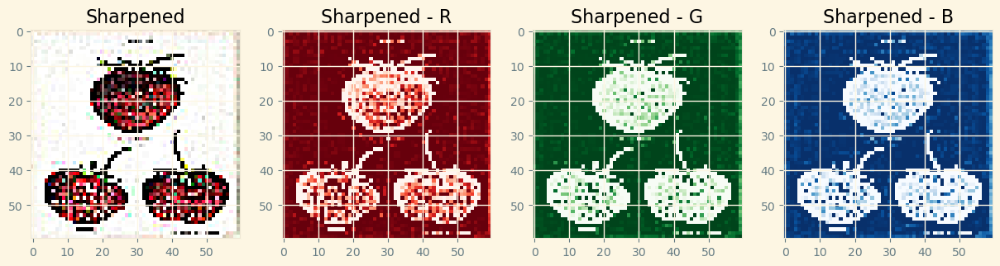

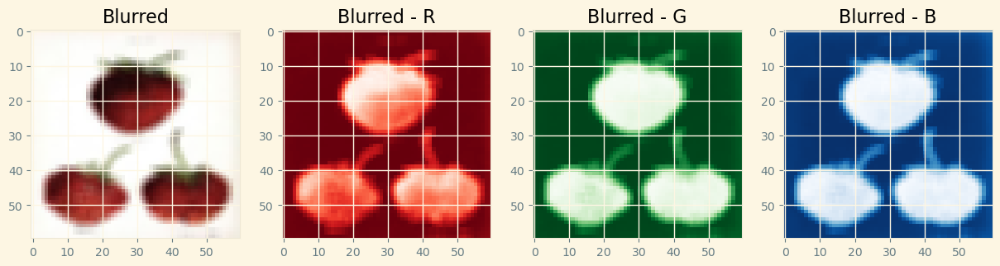

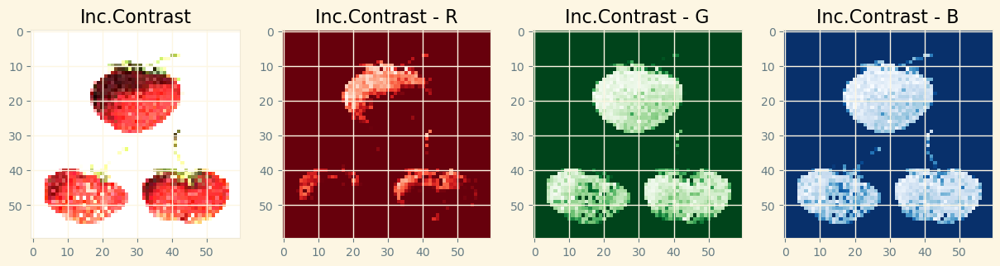

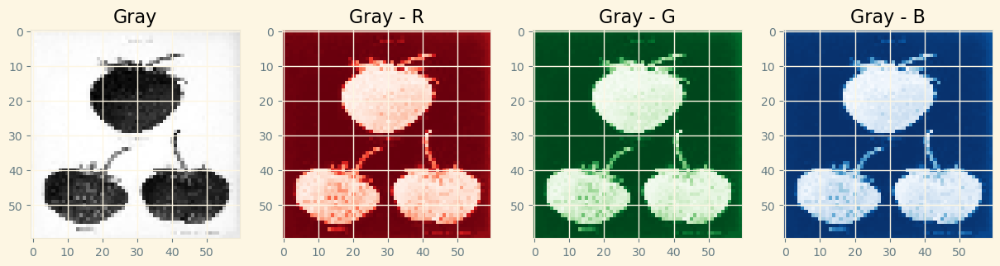

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1042.7856922685505].


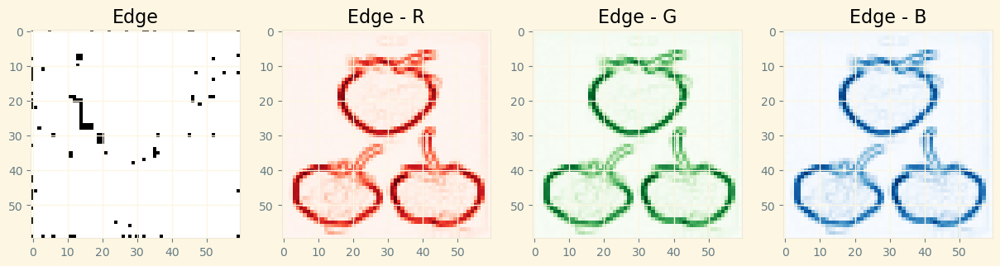

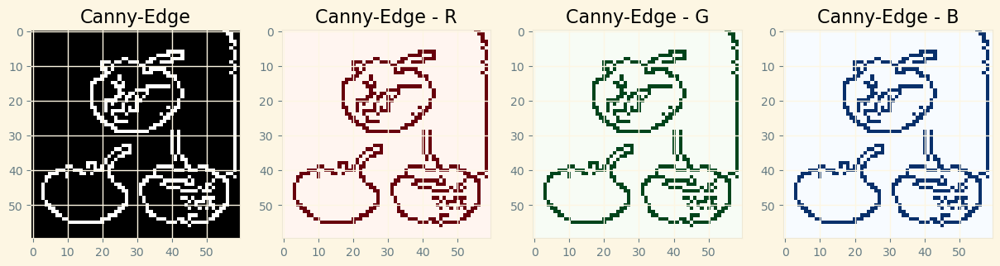

In [29]:
display_color_channels(strawberry_images[2])
display_rgb_values(strawberry_img_resized, "Resized")
display_rgb_values(strawberry_sharpened_img, "Sharpened")
display_rgb_values(strawberry_blurred, "Blurred")
display_rgb_values(strawberry_contrast_img, "Inc.Contrast")
display_rgb_values(strawberry_img_gray, "Gray")
display_rgb_values(strawberry_sobel, "Edge")
display_rgb_values(strawberry_edge_img, "Canny-Edge")

Shows image transformation techniques on a tomato image. Obtain transformed tomato images

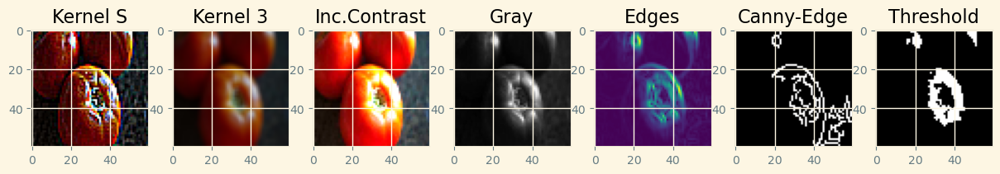

In [30]:
to_img, tomato_img_resized, tomato_sharpened_img, tomato_blurred, tomato_contrast_img, tomato_img_gray, tomato_sobel, tomato_edge_img = display_original_image_transformations(tomato_images[15])

Display the transformed tomato image's rgb values

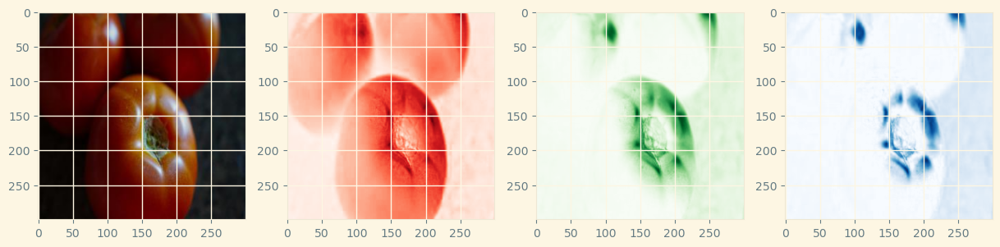

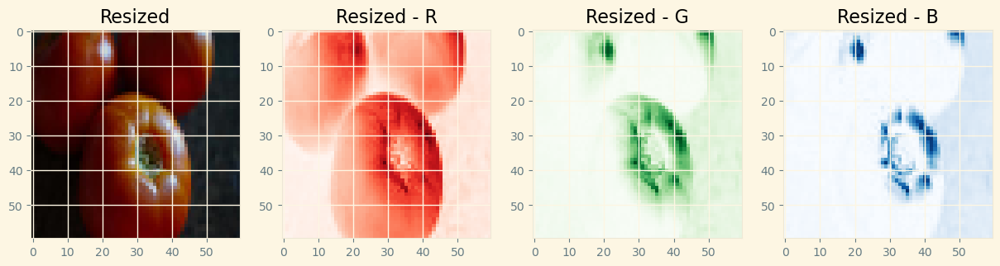

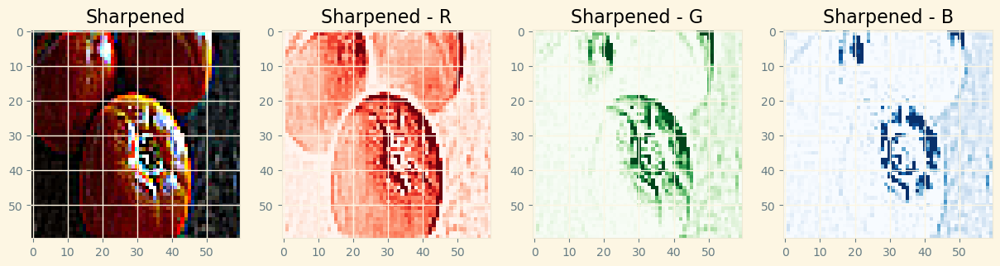

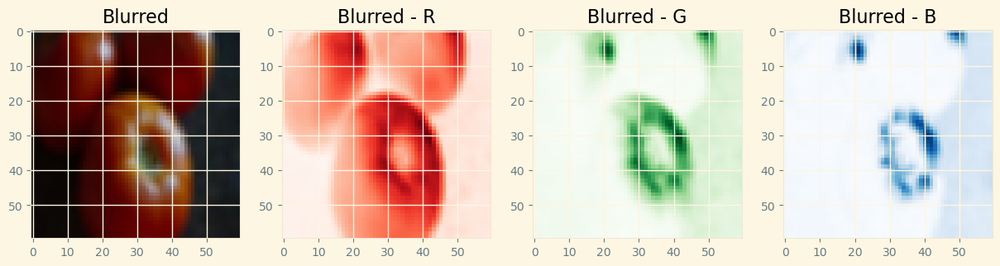

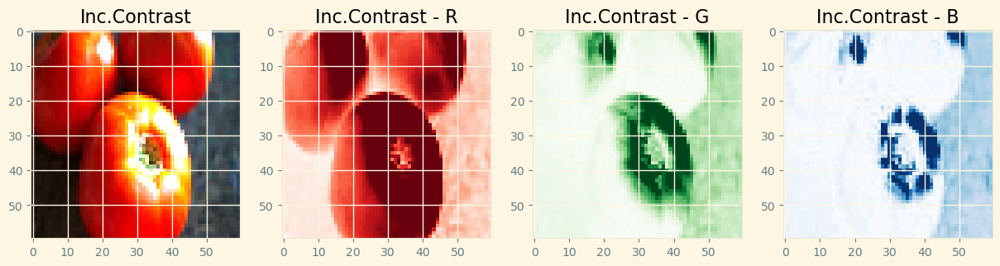

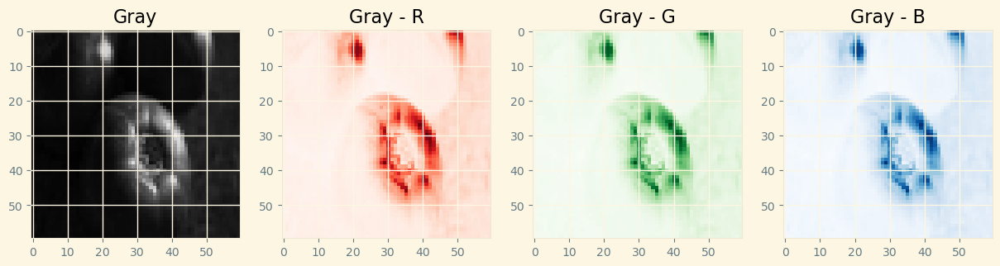

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..713.1353307753025].


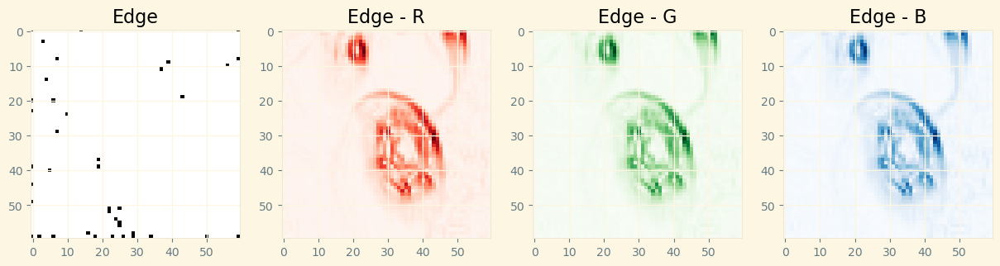

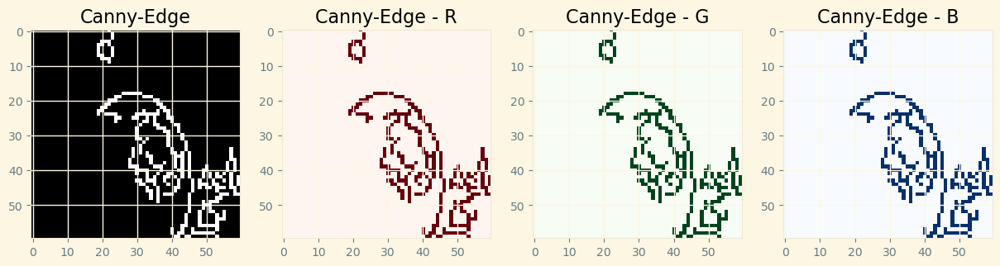

In [31]:
display_color_channels(tomato_images[15])
display_rgb_values(tomato_img_resized, "Resized")
display_rgb_values(tomato_sharpened_img, "Sharpened")
display_rgb_values(tomato_blurred, "Blurred")
display_rgb_values(tomato_contrast_img, "Inc.Contrast")
display_rgb_values(tomato_img_gray, "Gray")
display_rgb_values(tomato_sobel, "Edge")
display_rgb_values(tomato_edge_img, "Canny-Edge")

## Object and Background Pixel Analysis

Separate objects and backgrounds in the images and analyze the pixel values in the red, green, and blue channels for each. Plot histograms to visualize pixel distributions and compute statistics for each channel (min, max, mean, std)

### Cherry Section

In [32]:
cherry_img_obj_ids = [1, 2, 4, 11, 12, 14]
cherry_img_bck_ids = [0, 3, 5, 6, 7, 8]

cherry_imgs_object = []
cherry_imgs_backgr = []

for i in cherry_img_obj_ids:
    cherry_imgs_object.append(io.imread(cherry_images[i]))
    
for i in cherry_img_bck_ids:
    cherry_imgs_backgr.append(io.imread(cherry_images[i]))

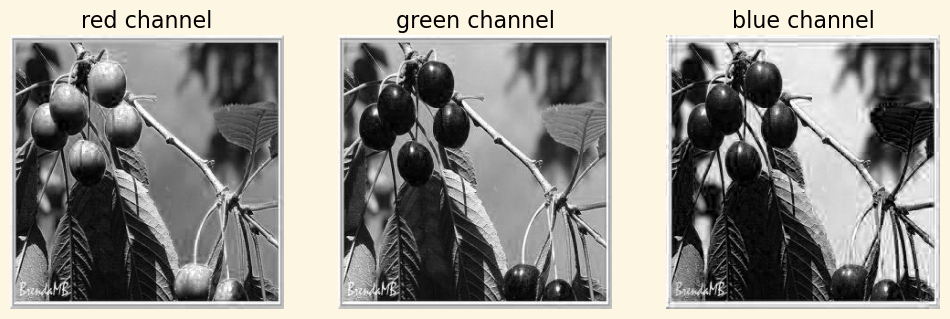

In [33]:
fig, axes = plt.subplots(1,3, figsize=(12,12))
cherry_colors = ['red', 'green', 'blue']
for i, ax in enumerate(axes):
    ax.imshow(cherry_imgs_object[0][:,:,i], cmap='gray')
    ax.set_title(cherry_colors[i]+' channel'), ax.axis('off')
plt.show()

In [34]:
ch_img_obj = cherry_imgs_object[0]
ch_img_bck = cherry_imgs_backgr[0]

ch_img_obj_channels = [ch_img_obj[0], ch_img_obj[1], ch_img_obj[2]]
ch_img_bck_channels = [ch_img_bck[0], ch_img_bck[1], ch_img_bck[2]]

print("Cherry Images with objects")
for i, channel in enumerate(ch_img_obj_channels):
    print(f"Channel {i} values: min: {channel.min()}, max: {channel.max()}, average: {channel.mean()}, std: {channel.std()}")

Cherry Images with objects
Channel 0 values: min: 194, max: 255, average: 249.17777777777778, std: 6.875039842757725
Channel 1 values: min: 188, max: 255, average: 248.10333333333332, std: 7.0267259643291755
Channel 2 values: min: 187, max: 255, average: 251.54888888888888, std: 5.394323033305877


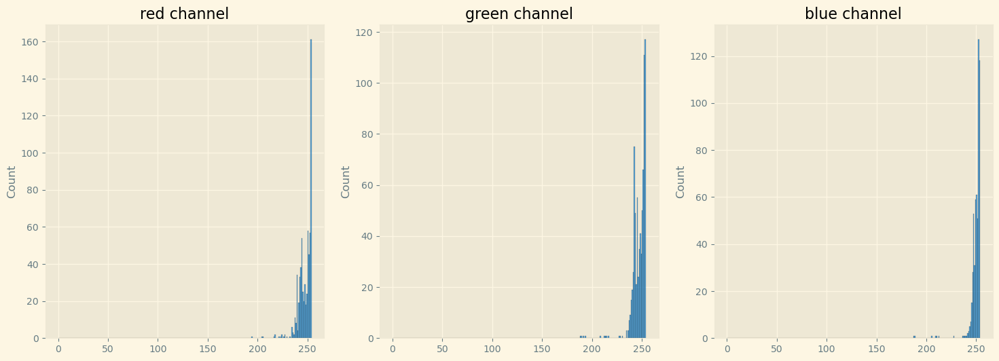

In [35]:
fig, axes = plt.subplots(1,3, figsize=(18,6))
for i, ax in enumerate(axes):
    df = ch_img_obj_channels[i].ravel()
    sns.histplot(df, bins=np.arange(0,255), ax=ax)
    ax.set_title(cherry_colors[i]+' channel')
plt.show()

In [36]:
print("Cherry Images with background only")
for i, channel in enumerate(ch_img_bck_channels):
    print(f"Channel {i} values: min: {channel.min()}, max: {channel.max()}, average: {channel.mean()}")

Cherry Images with background only
Channel 0 values: min: 17, max: 200, average: 100.45777777777778
Channel 1 values: min: 17, max: 202, average: 101.25555555555556
Channel 2 values: min: 17, max: 205, average: 102.28111111111112


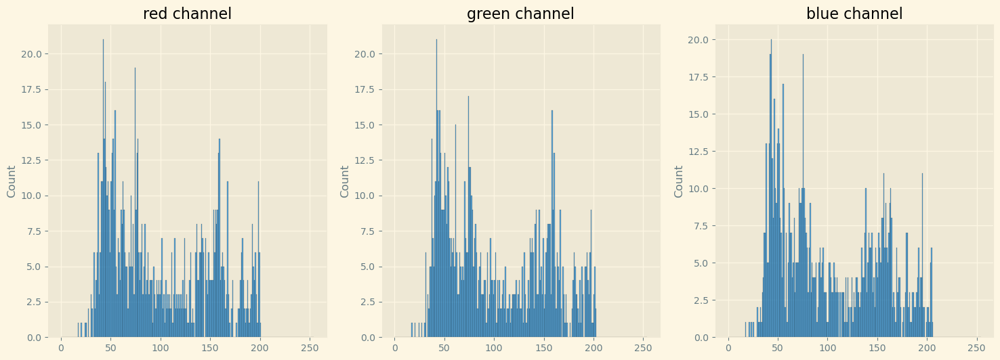

In [37]:
fig, axes = plt.subplots(1,3, figsize=(18,6))
for i, ax in enumerate(axes):
    df = ch_img_bck_channels[i].ravel()
    sns.histplot(df, bins=np.arange(0,255), ax=ax)
    ax.set_title(cherry_colors[i]+' channel')
plt.show()

### Strawberry Images

In [38]:
strawberry_img_obj_ids = [1, 2, 4, 11, 12, 14]
strawberry_img_bck_ids = [0, 3, 5, 6, 7, 8]

strawberry_imgs_object = []
strawberry_imgs_backgr = []

for i in strawberry_img_obj_ids:
    strawberry_imgs_object.append(io.imread(strawberry_images[i]))
    
for i in strawberry_img_bck_ids:
    strawberry_imgs_backgr.append(io.imread(strawberry_images[i]))

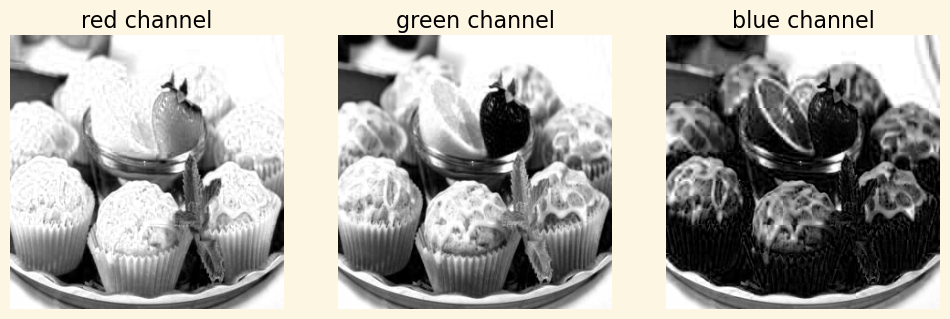

In [39]:
fig, axes = plt.subplots(1,3, figsize=(12,12))
strawberry_colors = ['red', 'green', 'blue']
for i, ax in enumerate(axes):
    ax.imshow(strawberry_imgs_object[0][:,:,i], cmap='gray')
    ax.set_title(strawberry_colors[i]+' channel'), ax.axis('off')
plt.show()

In [40]:
st_img_obj = strawberry_imgs_object[0]
st_img_bck = strawberry_imgs_backgr[0]

st_img_obj_channels = [st_img_obj[0], st_img_obj[1], st_img_obj[2]]
st_img_bck_channels = [st_img_bck[0], st_img_bck[1], st_img_bck[2]]

print("Strawberry Images with objects")
for i, channel in enumerate(st_img_obj_channels):
    print(f"Channel {i} values: min: {channel.min()}, max: {channel.max()}, average: {channel.mean()}, std: {channel.std()}")

Strawberry Images with objects
Channel 0 values: min: 0, max: 255, average: 185.86, std: 95.44839420103179
Channel 1 values: min: 0, max: 255, average: 186.4311111111111, std: 95.02289039365952
Channel 2 values: min: 0, max: 255, average: 187.09555555555556, std: 94.52883030073255


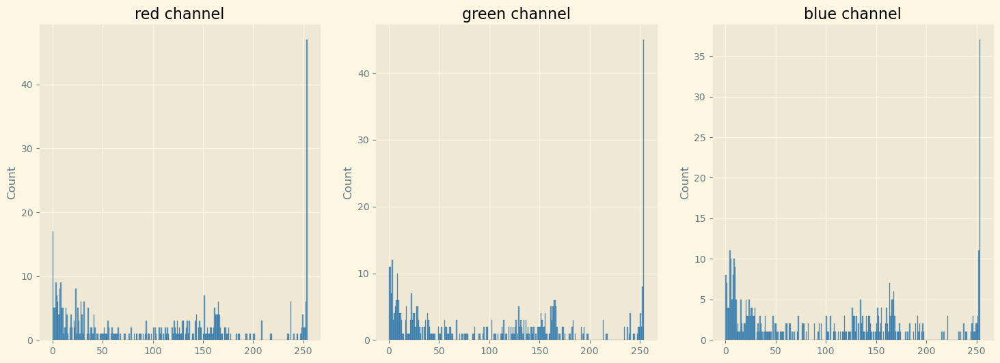

In [41]:
fig, axes = plt.subplots(1,3, figsize=(18,6))
for i, ax in enumerate(axes):
    df = st_img_obj_channels[i].ravel()
    sns.histplot(df, bins=np.arange(0,255), ax=ax)
    ax.set_title(strawberry_colors[i]+' channel')
plt.show()

In [42]:
print("Strawberry Images with background only")
for i, channel in enumerate(st_img_bck_channels):
    print(f"Channel {i} values: min: {channel.min()}, max: {channel.max()}, average: {channel.mean()}")

Strawberry Images with background only
Channel 0 values: min: 0, max: 0, average: 0.0
Channel 1 values: min: 0, max: 0, average: 0.0
Channel 2 values: min: 0, max: 0, average: 0.0


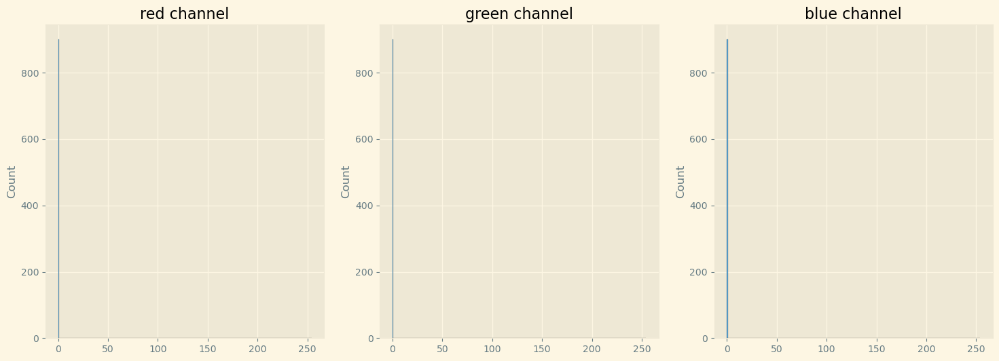

In [43]:
fig, axes = plt.subplots(1,3, figsize=(18,6))
for i, ax in enumerate(axes):
    df = st_img_bck_channels[i].ravel()
    sns.histplot(df, bins=np.arange(0,255), ax=ax)
    ax.set_title(strawberry_colors[i]+' channel')
plt.show()

### Tomato Images

In [44]:
tomato_img_obj_ids = [1, 2, 4, 11, 12, 14]
tomato_img_bck_ids = [0, 3, 5, 6, 7, 8]

tomato_imgs_object = []
tomato_imgs_backgr = []

for i in tomato_img_obj_ids:
    tomato_imgs_object.append(io.imread(tomato_images[i]))
    
for i in tomato_img_bck_ids:
    tomato_imgs_backgr.append(io.imread(tomato_images[i]))

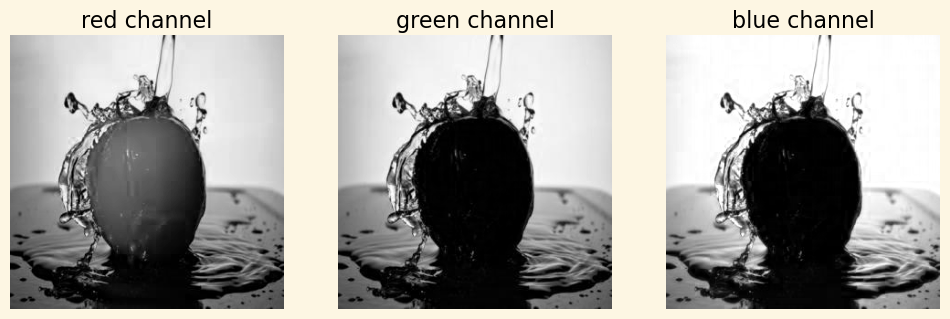

In [45]:
fig, axes = plt.subplots(1,3, figsize=(12,12))
tomato_colors = ['red', 'green', 'blue']
for i, ax in enumerate(axes):
    ax.imshow(tomato_imgs_object[0][:,:,i], cmap='gray')
    ax.set_title(tomato_colors[i]+' channel'), ax.axis('off')
plt.show()

In [46]:
to_img_obj = tomato_imgs_object[0]
to_img_bck = tomato_imgs_backgr[0]

to_img_obj_channels = [to_img_obj[0], to_img_obj[1], to_img_obj[2]]
to_img_bck_channels = [to_img_bck[0], to_img_bck[1], to_img_bck[2]]

print("Tomato Images with objects")
for i, channel in enumerate(to_img_obj_channels):
    print(f"Channel {i} values: min: {channel.min()}, max: {channel.max()}, average: {channel.mean()}, std: {channel.std()}")

Tomato Images with objects
Channel 0 values: min: 13, max: 255, average: 230.1811111111111, std: 30.535761891935618
Channel 1 values: min: 8, max: 255, average: 230.24777777777777, std: 30.470308782221927
Channel 2 values: min: 8, max: 255, average: 230.47, std: 29.909942419796725


Tomato Images with Objects only


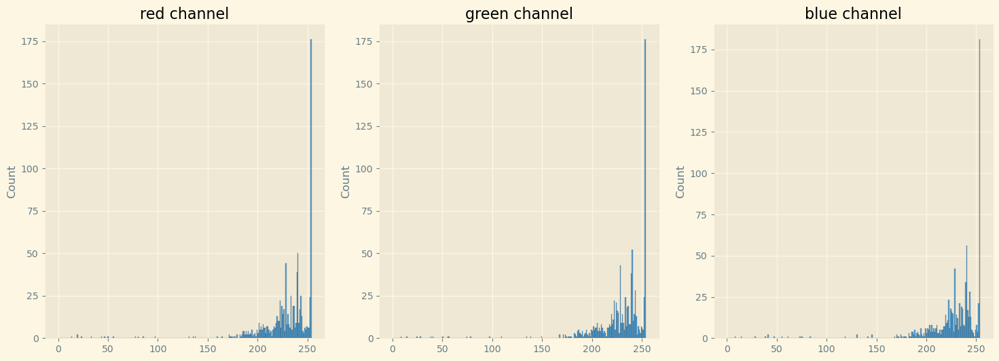

In [47]:
print("Tomato Images with Objects only")
fig, axes = plt.subplots(1,3, figsize=(18,6))
for i, ax in enumerate(axes):
    df = to_img_obj_channels[i].ravel()
    sns.histplot(df, bins=np.arange(0,255), ax=ax)
    ax.set_title(tomato_colors[i]+' channel')
plt.show()

In [48]:
print("Tomato Images with background only")
for i, channel in enumerate(to_img_bck_channels):
    print(f"Channel {i} values: min: {channel.min()}, max: {channel.max()}, average: {channel.mean()}")

Tomato Images with background only
Channel 0 values: min: 30, max: 255, average: 185.13888888888889
Channel 1 values: min: 0, max: 255, average: 148.79222222222222
Channel 2 values: min: 0, max: 255, average: 148.59222222222223


Tomato Images with background only


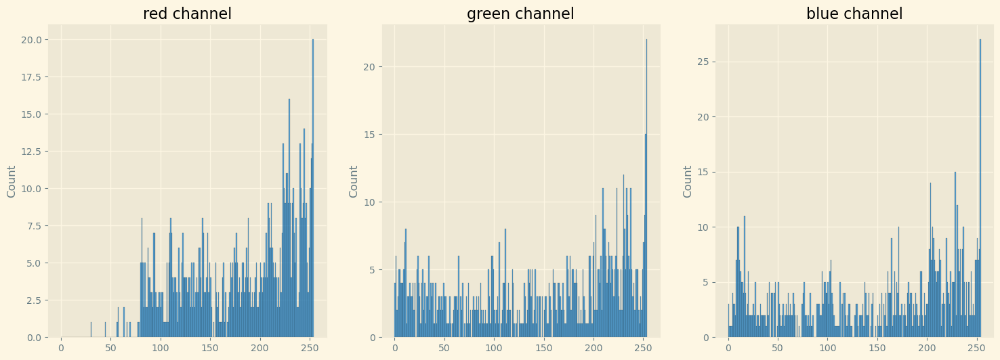

In [49]:
print("Tomato Images with background only")
fig, axes = plt.subplots(1,3, figsize=(18,6))
for i, ax in enumerate(axes):
    df = to_img_bck_channels[i].ravel()
    sns.histplot(df, bins=np.arange(0,255), ax=ax)
    ax.set_title(tomato_colors[i]+' channel')
plt.show()

## Image Augementations

Perform Image Augementation. Performing this can help the model generalize better to unseen data when training
- flipping
- rotation
- zooming

In [50]:
def augment_image(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    flipped_image = tf.image.flip_left_right(image)
    rotated_image = tf.image.rot90(image)
    zoom_factor = np.random.uniform(0.6, 0.8)
    zoomed_image = tf.image.central_crop(image, zoom_factor)
    
    return flipped_image, rotated_image, zoomed_image

Method to present the augmented image

In [51]:
def show_augmented_image(flipped, rotated, zoomed):
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(flipped)
    plt.title("Flipped Image")
    
    plt.subplot(1, 3, 2)
    plt.imshow(rotated)
    plt.title("Rotated Image")
    
    plt.subplot(1, 3, 3)
    plt.imshow(zoomed)
    plt.title("Zoomed Image")
    plt.show()

## Feature Extraction

Color histograms are computed for each image channel (R, G, B) providing insight into the pixel intensity distribution within the image.

In [52]:
def compute_color_histogram(image):
    color = ('r', 'g', 'b')
    for i, col in enumerate(color):
        hist = cv2.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(hist, color=col)
        plt.xlim([0, 256])
    plt.title('Color Histogram')
    plt.show()


Local Binary Pattern (LBP) is used as a texture descriptor to capture texture features. May improve model performance in classification tasks.

In [53]:
def compute_lbp(image):
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    radius = 1
    n_points = 8 * radius
    lbp = local_binary_pattern(img_gray, n_points, radius, method='uniform')
    plt.imshow(lbp, cmap='gray')
    plt.title('Local Binary Pattern')
    plt.show()

Removes blue and green noise by setting the blue and green channels to zero. Useful for focusing on the red channel, especially for red-hued objects (cherry, tomato, strawberry)

In [54]:
def remove_blue_green_noise(image):
    image[:, :, 1] = 0
    image[:, :, 2] = 0
    return image

To visualize changes in the images

In [55]:
def display_modified_image_transformations(img):
    img_resized = cv2.resize(img, (0, 0), fx=0.2, fy=0.2)
    kernel_sharpening = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    kernel_3x3 = np.ones((3, 3), np.float32) / 9
    sharpened_img = cv2.filter2D(img_resized, -1, kernel_sharpening)
    blurred = cv2.filter2D(img_resized, -1, kernel_3x3)
    contrast_img = cv2.addWeighted(img_resized, 2.5, np.zeros(img_resized.shape, img_resized.dtype), 0, 0)
    img_gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    sobel_x = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
    sobel_combined = cv2.magnitude(sobel_x, sobel_y)
    edge_img = cv2.Canny(img_resized, 10, 1000)
    threshold_img = cv2.threshold(img_gray, 0.5, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    fig, ax = plt.subplots(1, 7, figsize=(15, 20))
    ax[0].imshow(sharpened_img)
    ax[0].set_title('Kernel S')
    
    ax[1].imshow(blurred)
    ax[1].set_title('Kernel 3')
    
    ax[2].imshow(contrast_img)
    ax[2].set_title('Inc.Contrast')
    
    ax[3].imshow(img_gray, cmap='gray')
    ax[3].set_title('Gray')
    
    ax[4].imshow(sobel_combined)
    ax[4].set_title('Edges')
    
    ax[5].imshow(edge_img, cmap='gray')
    ax[5].set_title('Canny-Edge')
    
    ax[6].imshow(threshold_img[1], cmap='gray')
    ax[6].set_title('Threshold')
    
    plt.show()
    
    return img_resized, sharpened_img, blurred, contrast_img, img_gray, sobel_combined

### Cherry Image

2024-10-26 15:22:41.221990: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Pro
2024-10-26 15:22:41.222014: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 18.00 GB
2024-10-26 15:22:41.222021: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 6.00 GB
2024-10-26 15:22:41.222065: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-10-26 15:22:41.222078: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


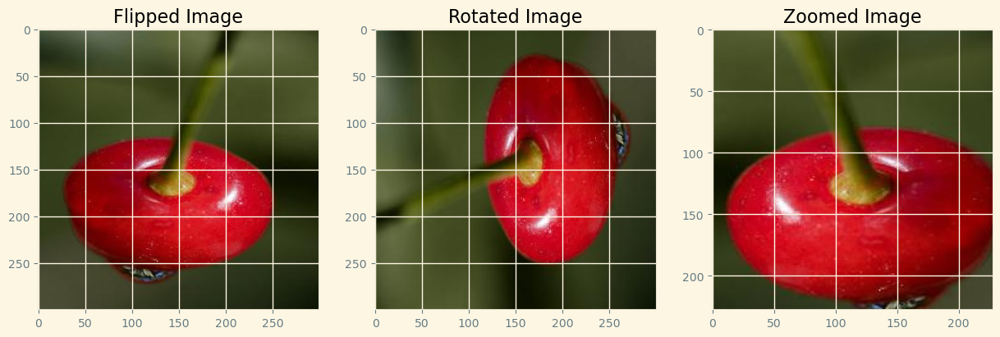

In [56]:
cherry_image = cv2.imread(cherry_images[2])

cherry_flipped, cherry_rotated, cherry_zoomed = augment_image(cherry_image)
show_augmented_image(cherry_flipped, cherry_rotated, cherry_zoomed)

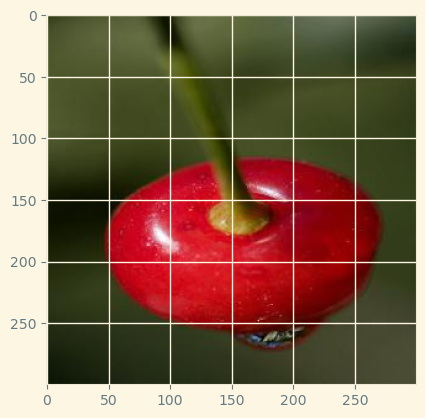

In [57]:
cherry_image = cv2.imread(cherry_images[2])
cherry_image = cv2.cvtColor(cherry_image, cv2.COLOR_BGR2RGB)
plt.imshow(cherry_image)

CHERRY IMAGE HISTOGRAM


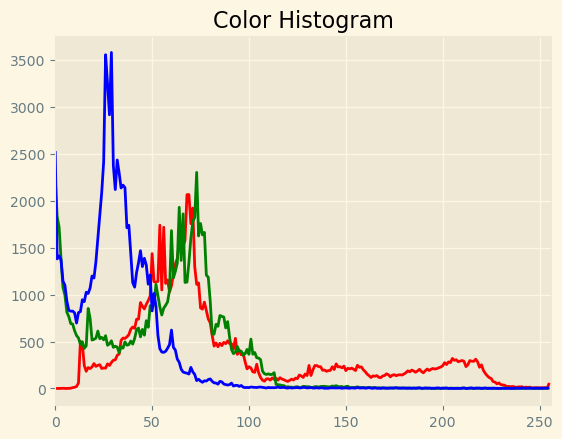

In [58]:
print("CHERRY IMAGE HISTOGRAM")
compute_color_histogram(cherry_image)

CHERRY LBP


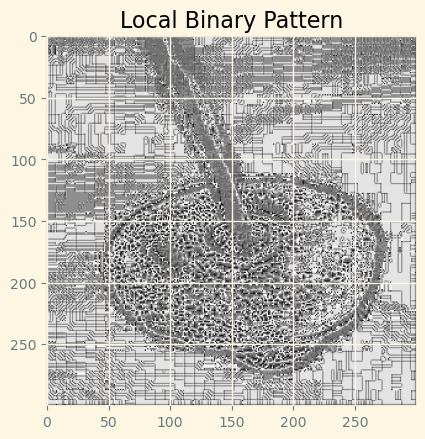

In [59]:
print("CHERRY LBP")
compute_lbp(cherry_image)

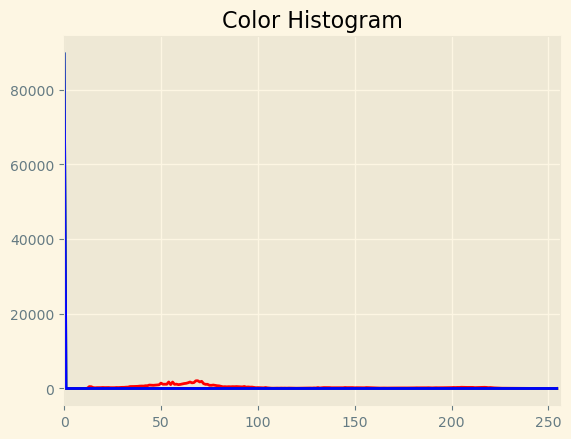

In [60]:
removed_noise_cherry = remove_blue_green_noise(cherry_image)
compute_color_histogram(removed_noise_cherry)

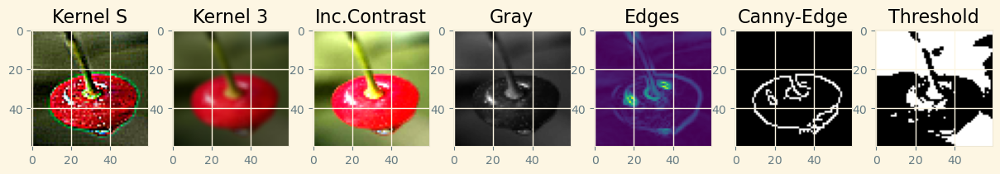

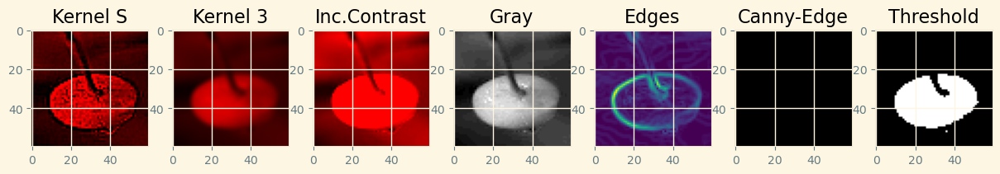

In [61]:
ch_img, cherry_img_resized, cherry_sharpened_img, cherry_blurred, cherry_contrast_img, cherry_img_gray, cherry_sobel, cherry_edge_img = display_original_image_transformations(cherry_images[2])
cherry_modified_img_resized, cherry_modified_sharpened_img, cherry_modified_blurred, cherry_modified_contrast_img, cherry_modified_img_gray, cherry_modified_sobel = display_modified_image_transformations(removed_noise_cherry)

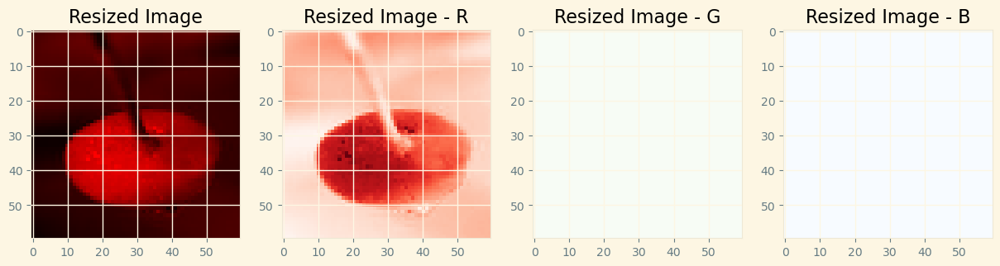

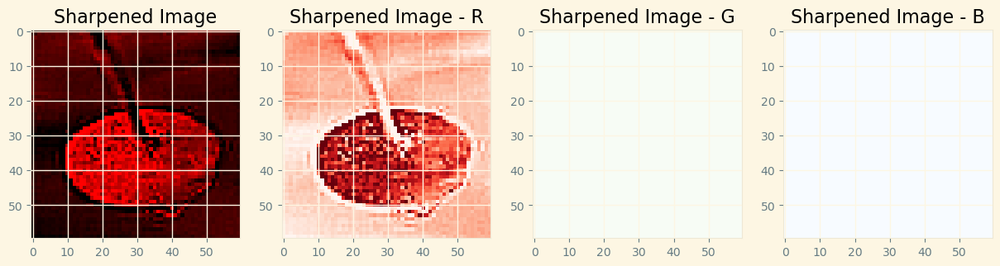

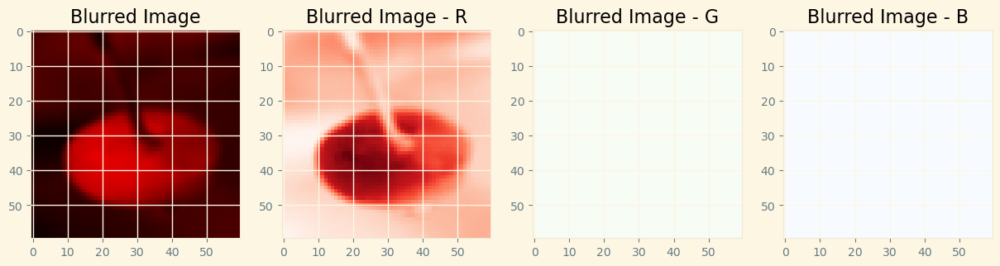

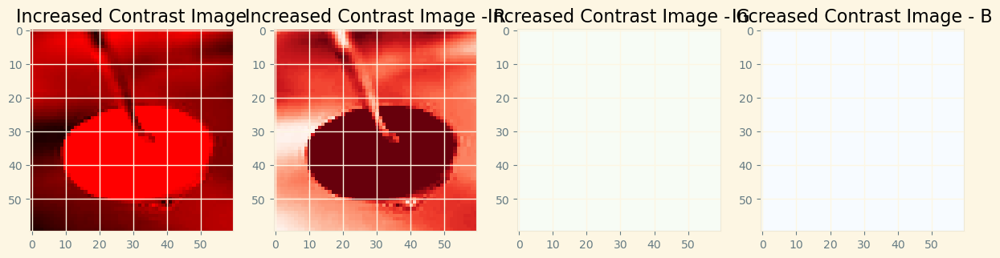

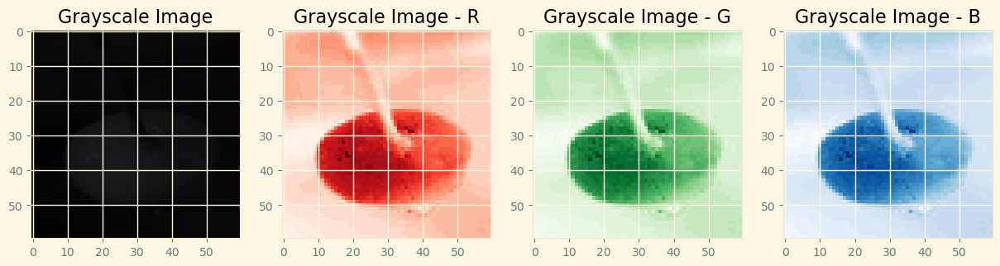

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..81.93900170248598].


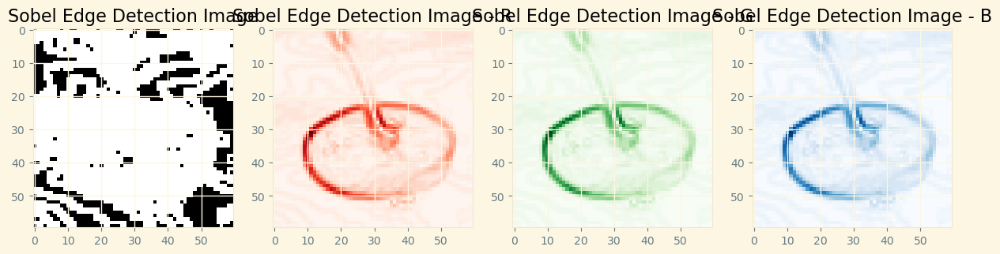

In [62]:
display_rgb_values(cherry_modified_img_resized, "Resized Image")
display_rgb_values(cherry_modified_sharpened_img, "Sharpened Image")
display_rgb_values(cherry_modified_blurred, "Blurred Image")
display_rgb_values(cherry_modified_contrast_img, "Increased Contrast Image")
display_rgb_values(cherry_modified_img_gray, "Grayscale Image")
display_rgb_values(cherry_modified_sobel, "Sobel Edge Detection Image")

### Strawberry Image

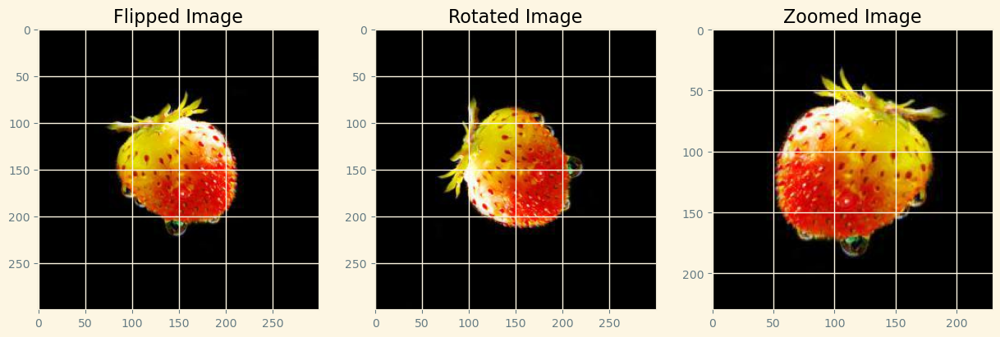

In [63]:
strawberry_image = cv2.imread(strawberry_images[0])
strawberry_flipped, strawberry_rotated, strawberry_zoomed = augment_image(strawberry_image)
show_augmented_image(strawberry_flipped, strawberry_rotated, strawberry_zoomed)

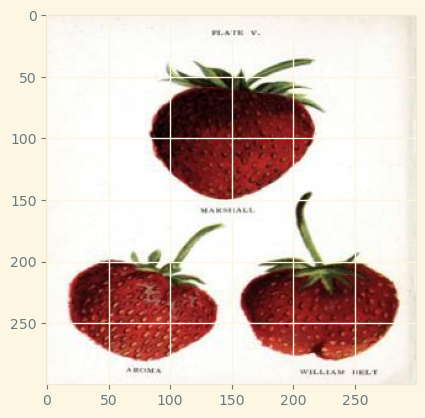

In [64]:
strawberry_image = cv2.imread(strawberry_images[2])
strawberry_image = cv2.cvtColor(strawberry_image, cv2.COLOR_BGR2RGB)
plt.imshow(strawberry_image)

STRAWBERRY IMAGE HISTOGRAM


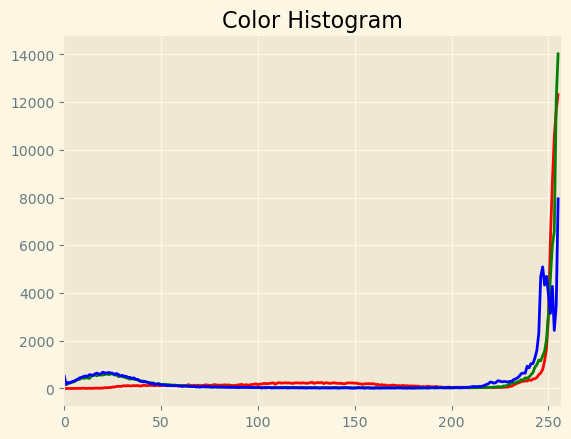

In [65]:
print("STRAWBERRY IMAGE HISTOGRAM")
compute_color_histogram(strawberry_image)

STRAWBERRY LBP


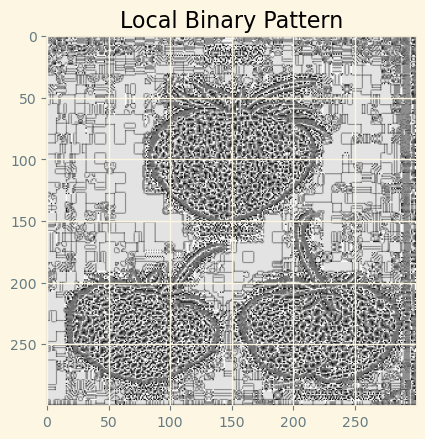

In [66]:
print("STRAWBERRY LBP")
compute_lbp(strawberry_image)

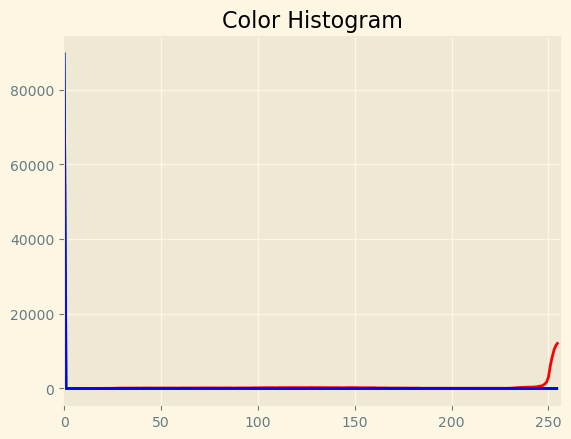

In [67]:
removed_noise_strawberry = remove_blue_green_noise(strawberry_image)
compute_color_histogram(removed_noise_strawberry)

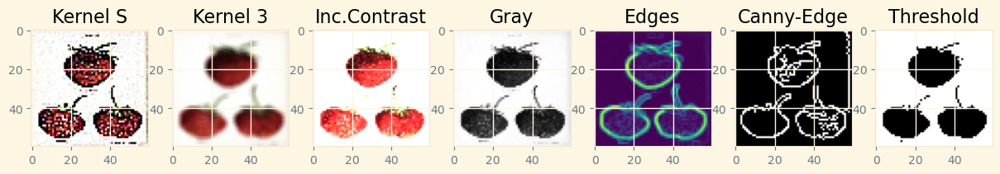

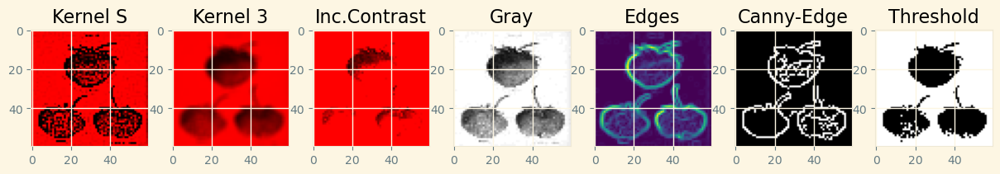

In [68]:
st_img, strawberry_img_resized, strawberry_sharpened_img, strawberry_blurred, strawberry_contrast_img, strawberry_img_gray, strawberry_sobel, strawberry_edge_img = display_original_image_transformations(strawberry_images[2])
strawberry_modified_img_resized, strawberry_modified_sharpened_img, strawberry_modified_blurred, strawberry_modified_contrast_img, strawberry_modified_img_gray, strawberry_modified_sobel = display_modified_image_transformations(removed_noise_strawberry)

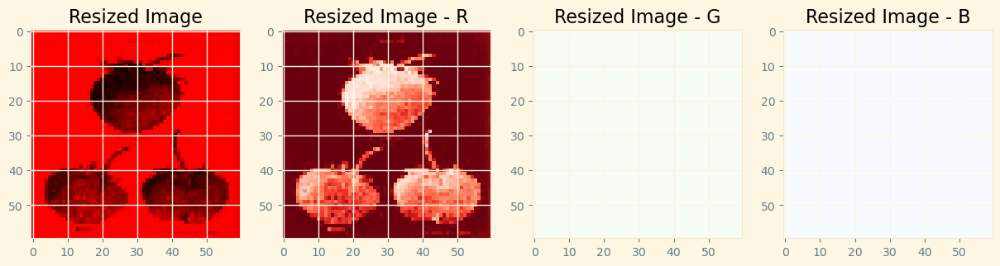

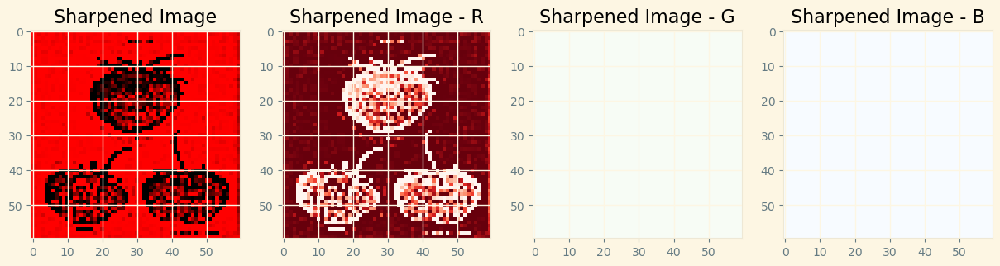

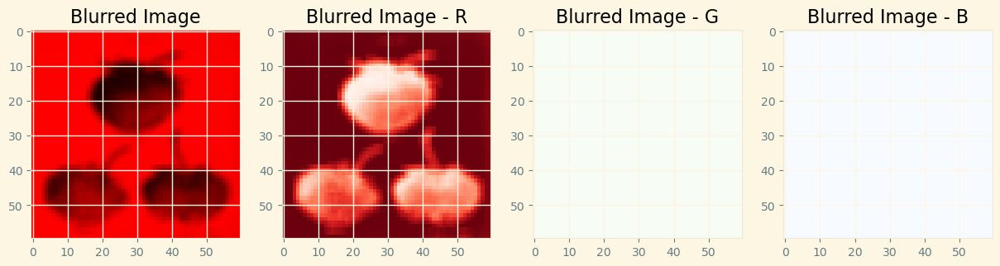

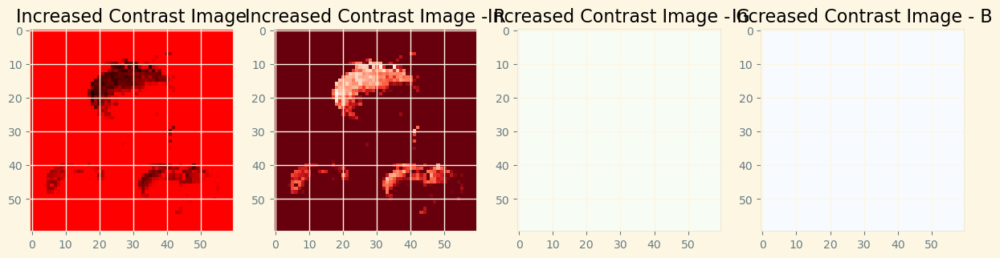

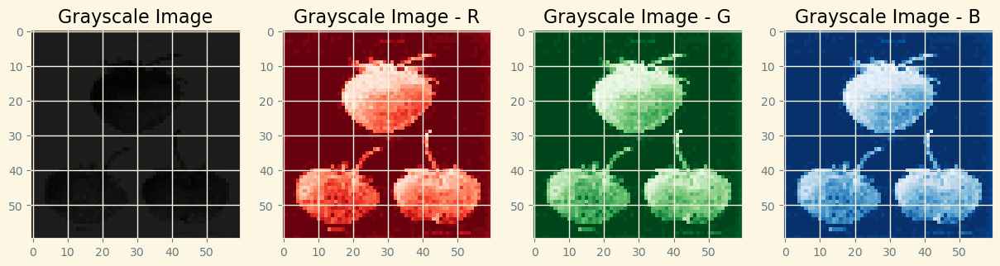

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..108.6830253535482].


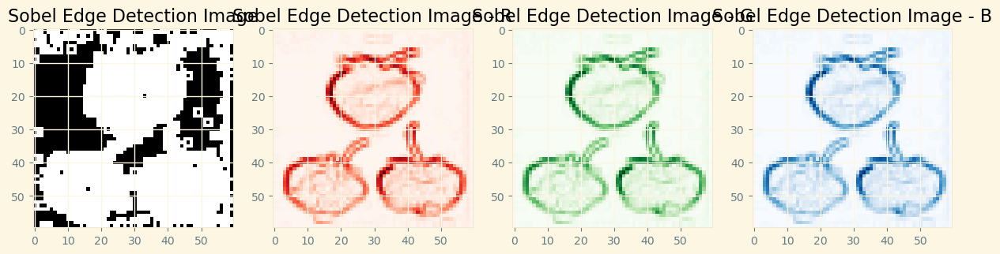

In [69]:
display_rgb_values(strawberry_modified_img_resized, "Resized Image")
display_rgb_values(strawberry_modified_sharpened_img, "Sharpened Image")
display_rgb_values(strawberry_modified_blurred, "Blurred Image")
display_rgb_values(strawberry_modified_contrast_img, "Increased Contrast Image")
display_rgb_values(strawberry_modified_img_gray, "Grayscale Image")
display_rgb_values(strawberry_modified_sobel, "Sobel Edge Detection Image")

### Tomato Image

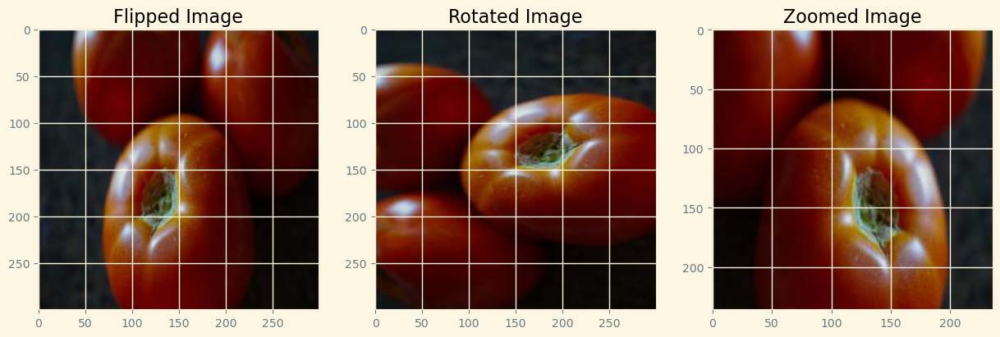

In [70]:
tomato_image = cv2.imread(tomato_images[15])

tomato_flipped, tomato_rotated, tomato_zoomed = augment_image(tomato_image)
show_augmented_image(tomato_flipped, tomato_rotated, tomato_zoomed)

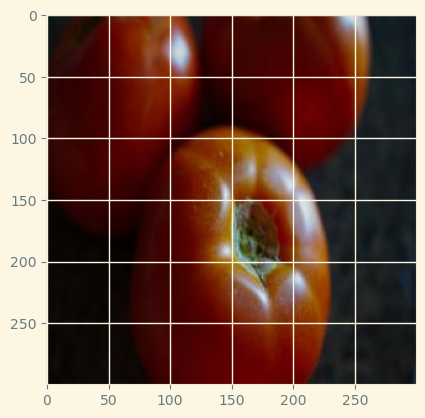

In [71]:
tomato_image = cv2.imread(tomato_images[15])
tomato_image = cv2.cvtColor(tomato_image, cv2.COLOR_BGR2RGB)
plt.imshow(tomato_image)

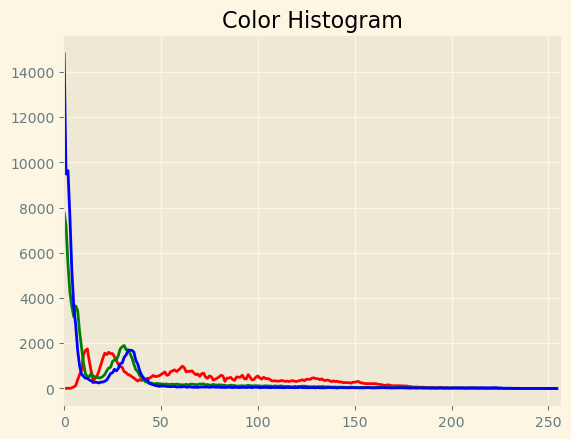

In [72]:
compute_color_histogram(tomato_image)

TOMATO LBP


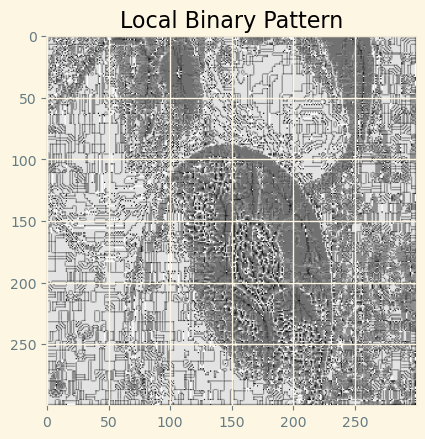

In [73]:
print("TOMATO LBP")
compute_lbp(tomato_image)

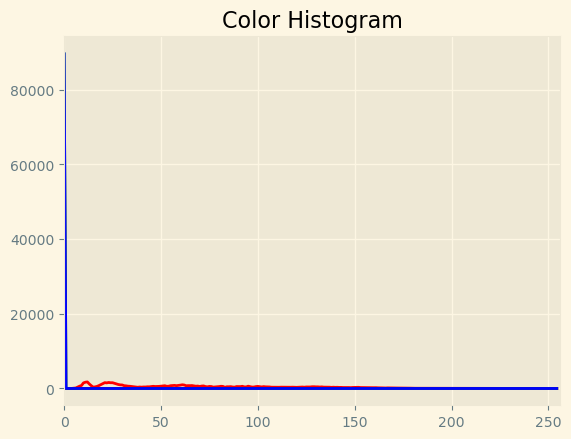

In [74]:
removed_noise_tomato = remove_blue_green_noise(tomato_image)
compute_color_histogram(removed_noise_tomato)

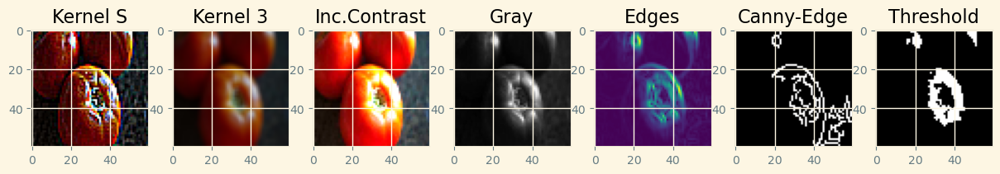

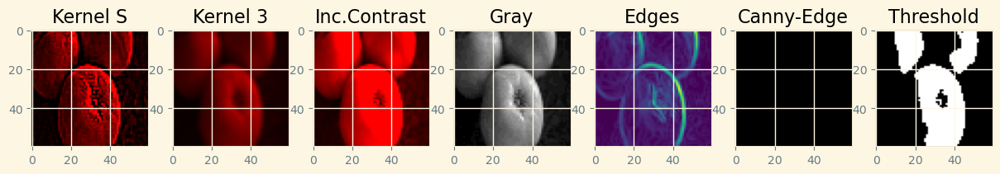

In [75]:
to_img, tomato_img_resized, tomato_sharpened_img, tomato_blurred, tomato_contrast_img, tomato_img_gray, tomato_sobel, tomato_edge_img = display_original_image_transformations(tomato_images[15])
tomato_modified_img_resized, tomato_modified_sharpened_img, tomato_modified_blurred, tomato_modified_contrast_img, tomato_modified_img_gray, tomato_modified_sobel = display_modified_image_transformations(removed_noise_tomato)

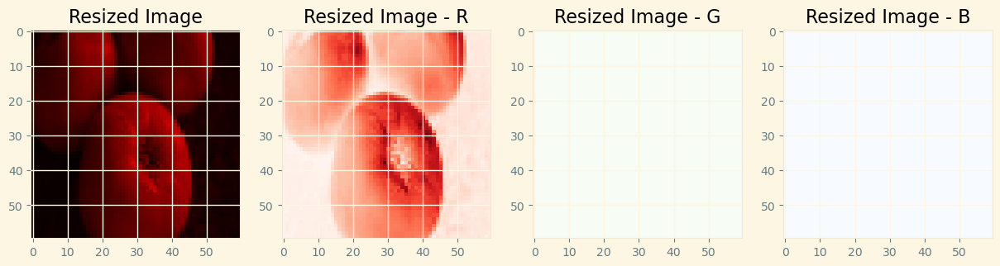

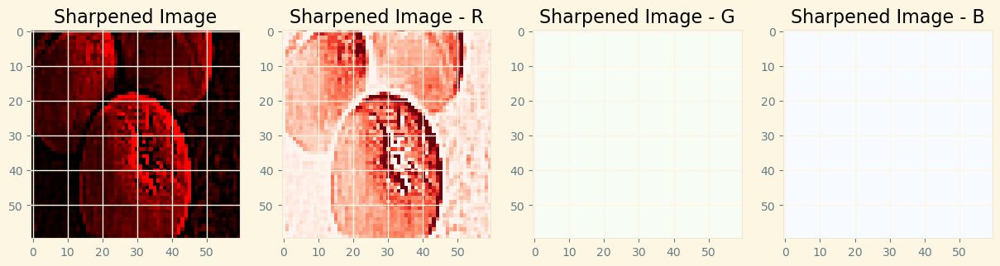

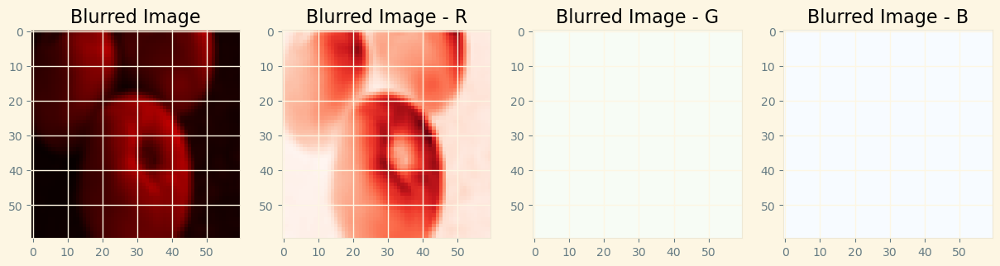

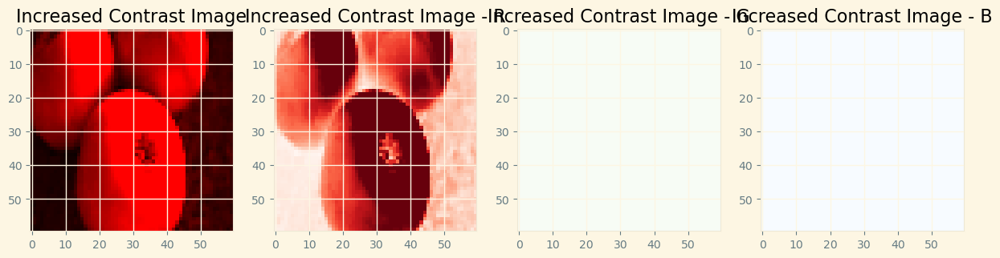

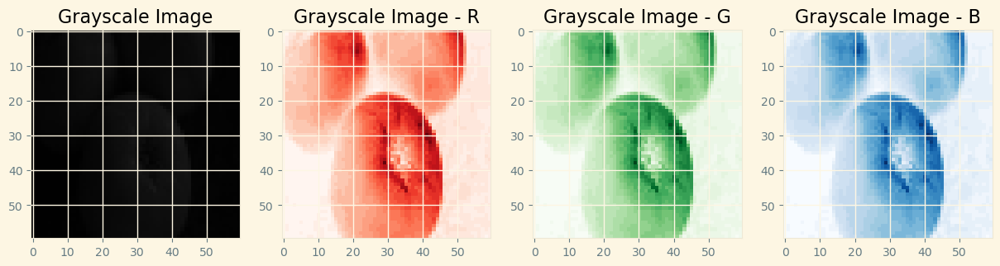

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..80.36168241145776].


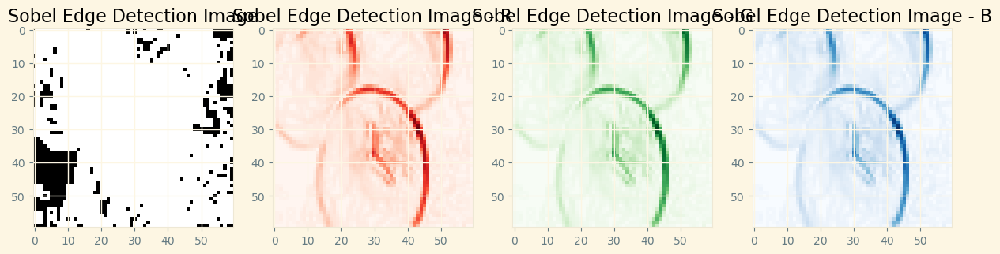

In [76]:
display_rgb_values(tomato_modified_img_resized, "Resized Image")
display_rgb_values(tomato_modified_sharpened_img, "Sharpened Image")
display_rgb_values(tomato_modified_blurred, "Blurred Image")
display_rgb_values(tomato_modified_contrast_img, "Increased Contrast Image")
display_rgb_values(tomato_modified_img_gray, "Grayscale Image")
display_rgb_values(tomato_modified_sobel, "Sobel Edge Detection Image")

## Performing Removal Of Background

Can enforce that the object of the image can be used in the model instead of interpreting the whole picture

In [77]:
def remove_background(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    _, thresh = cv2.threshold(blurred, 120, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest_contour = max(contours, key=cv2.contourArea)
    mask = np.zeros_like(image)
    cv2.drawContours(mask, [largest_contour], -1, (255, 255, 255), thickness=cv2.FILLED)
    result = cv2.bitwise_and(image, mask)

    return result, mask

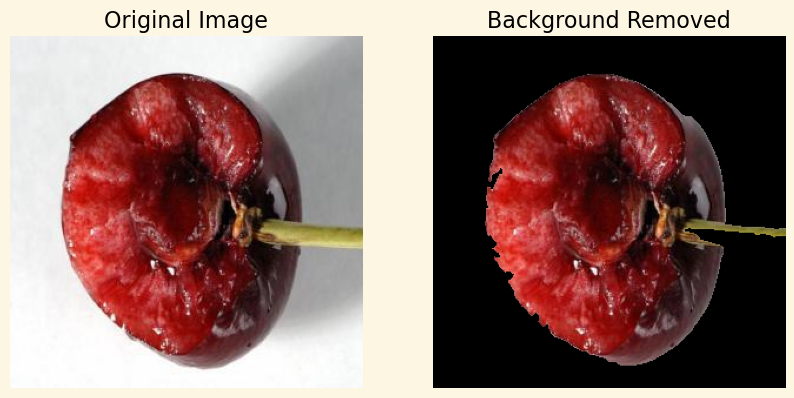

In [78]:
original_cherry_image = cv2.imread(cherry_images[3])
original_cherry_image = cv2.cvtColor(original_cherry_image, cv2.COLOR_BGR2RGB)

cherry_image = cv2.imread(cherry_images[3])
cherry_image = cv2.cvtColor(cherry_image, cv2.COLOR_BGR2RGB)

o_result_image, mask = remove_background(cherry_image)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(cherry_image)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title("Background Removed")
plt.imshow(o_result_image)
plt.axis('off')
plt.show()

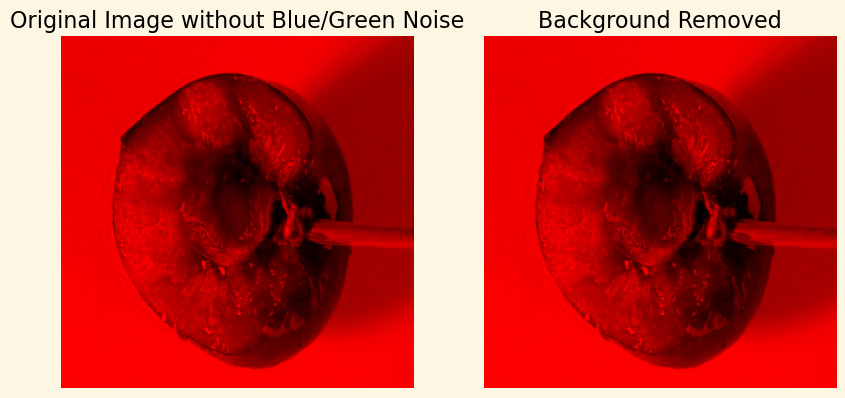

In [79]:
cherry_image = cv2.imread(cherry_images[3])
cherry_image = cv2.cvtColor(cherry_image, cv2.COLOR_BGR2RGB)

cherry_image_removed_gb = remove_blue_green_noise(cherry_image)
m_result_image, mask = remove_background(cherry_image_removed_gb)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Image without Blue/Green Noise")
plt.imshow(cherry_image_removed_gb)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title("Background Removed")
plt.imshow(m_result_image)
plt.axis('off')
plt.show()

Comparing removed background, removed color and original images against transformation techniques 

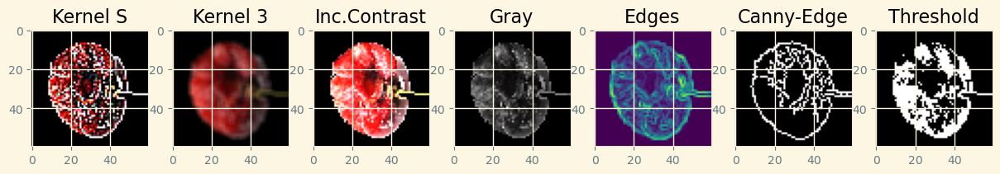

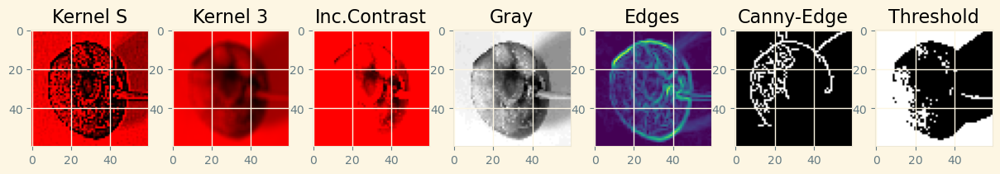

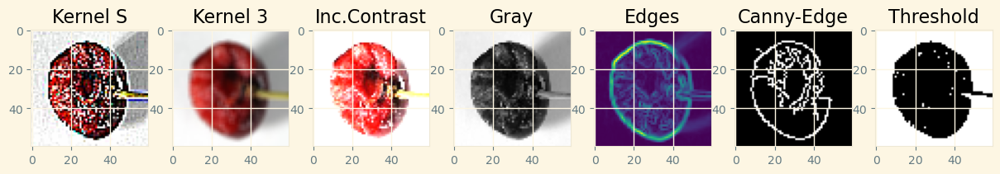

In [80]:
a, b, c, d, e, f = display_modified_image_transformations(o_result_image)
g, h, i, j, k, l = display_modified_image_transformations(m_result_image)
m, n, o, p, q, r = display_modified_image_transformations(original_cherry_image)